# Import libraries

In [1]:
import pandas as pd
import ast
import numpy as np
from IPython.display import display

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

from sklearn.linear_model import LinearRegression

# Utility functions

In [2]:
def base_information(data):
    df = pd.DataFrame(data.dtypes, columns=['dtypes'])
    df['Number of missing values'] = data.isna().sum()
    df['Percentage of missing values'] = data.isna().sum() / data.shape[0] * 100
    df['Unique values'] = data.nunique().values
    df['Count'] = data.count().values
    df = df.reset_index().rename(columns={'index': 'Column'})
    styled_df = (
        df
        .style
        .set_caption("📝 Base Information")
        .format({
            'Number of missing values': '{:,.0f}',
            'Percentage of missing values': '{:.2f}%',
            'Unique values': '{:,.0f}',
            'Count': '{:,.0f}'
        })
        .bar(subset=['Percentage of missing values'], color='#4a90e2', vmin=0, vmax=100)
        .set_properties(**{
            'text-align': 'left',
            'font-family': 'Times New Roman',
            'font-size': '1.25em',  # Increased font size for cell content
            'background-color':  '#f9f9f9',
            'border': '1px solid #ddd',
            'color': '#333'
        })
        .set_table_styles([{'selector': 'th','props': [('font-weight', 'bold'), ('border', '1px solid #ddd')]}])
    )
    return styled_df

def initial_columns_removal(df: pd.DataFrame) -> pd.DataFrame:
    """
    Remove features that are not useful for the model:
        - 1 unique value (variance = 0)
        - all missing values
        - duplicated columns
    
    Args:
        df (pd.DataFrame): DataFrame to be cleaned.
    
    Returns:
        pd.DataFrame: Cleaned DataFrame.
    """
    number_of_columns_before = df.shape[1]

    # Remove columns with only 1 unique value
    nunique_mask = df.nunique() > 1
    single_unique_cols = df.columns[~nunique_mask].tolist()
    if single_unique_cols:
        print(f"Removed columns with only 1 unique value: {single_unique_cols}")
    df = df.loc[:, nunique_mask]

    # Remove columns with all missing values
    na_mask = ~df.isna().all()
    all_na_cols = df.columns[~na_mask].tolist()
    if all_na_cols:
        print(f"Removed columns with all missing values: {all_na_cols}")
    df = df.loc[:, na_mask]

    # Remove duplicated columns
    duplicated_mask = ~df.columns.duplicated()
    duplicated_cols = df.columns[~duplicated_mask].tolist()
    if duplicated_cols:
        print(f"Removed duplicated columns: {duplicated_cols}")
    df = df.loc[:, duplicated_mask]

    print(f"Total columns removed: {number_of_columns_before - df.shape[1]}")
    return df.reset_index(drop=True)

def get_categorical_columns(df: pd.DataFrame) -> list[str]:
    """
    Get categorical columns from the DataFrame.

    Args:
        df (pd.DataFrame): The input DataFrame.
    
    Returns:
        list[str]: List of categorical columns.
    """
    categorical_columns = df.select_dtypes(include=['object', 'category']).columns
    categorical_columns = [col for col in categorical_columns if df[col].nunique() < 100]
    categorical_columns = list(set(categorical_columns) | set(df.columns[df.nunique() < 10]))
    return categorical_columns

def drop_highly_skewed_categorical_columns(df, columns_to_investigate, threshold=0.99) -> pd.DataFrame:
    """
    Show categorical columns with a distribution where one value is more than the specified threshold of the data.
    
    Args:
        data (pd.DataFrame): The input DataFrame.
        columns_to_investigate (list): List of categorical columns to investigate.
        threshold (float): The threshold for skewness in the distribution.
        
    Returns:
        pd.DataFrame: The DataFrame with highly skewed categorical columns dropped.
    """
    count = 0
    print(f"Highly skewed categorical columns with a distribution where one value is more than {threshold*100:.2f}% of the data:\n")
    for column in columns_to_investigate:
        value_counts = df[column].value_counts(normalize=True)
        if (value_counts.max() > threshold):
            print(f"  - {column} (value '{value_counts.idxmax()}' with {value_counts.max()*100:.2f}% of the data)")
            df.drop(columns=[column], axis=1, inplace=True)
            count += 1
    print(f"Number of columns after removal: {df.shape[1]}. Removed {count} columns.")
    return df

def categorize_categorical_columns_by_missing(data: pd.DataFrame, categorical_columns: list[str]) -> dict[str, list[str]]:
    """
    Categorize categorical columns in the DataFrame by their proportion of missing values.

    Args:
        data (pd.DataFrame): The input DataFrame.
        categorical_columns (list[str]): List of categorical columns.

    Returns:
        dict[str, list[str]]: Dictionary with keys as types of categorical columns and values as lists of column names.
    """
    categorical_not_many_missing_columns = [col for col in categorical_columns if 0 < data[col].isnull().mean() <= 0.1]
    categorical_many_missing_columns = [col for col in categorical_columns if data[col].isnull().mean() > 0.1]
    categorical_missing_columns = [col for col in categorical_columns if data[col].isnull().mean() > 0.0]
    non_missing_categorical_columns = [col for col in categorical_columns if data[col].isnull().mean() == 0.0]
    return  {
        "categorical_not_many_missing_columns": categorical_not_many_missing_columns,
        "categorical_many_missing_columns": categorical_many_missing_columns,
        "categorical_missing_columns": categorical_missing_columns,
        "non_missing_categorical_columns": non_missing_categorical_columns
    }

def describe_numerical_feature(data, feature):
    """
    Enhanced numerical feature analysis with styling for clear Copilot sharing.

    Args:
        data (pd.DataFrame): The input DataFrame.
        feature (str): The numerical feature to analyze.

    Returns:
        pd.DataFrame: A styled DataFrame summarizing the feature's statistics.
    """
    stats = data[feature].describe().T
    stats["5%"] = data[feature].quantile(0.05)
    stats["95%"] = data[feature].quantile(0.95)
    stats['variance'] = data[feature].var()
    stats['skewness'] = data[feature].skew()
    stats['kurtosis'] = data[feature].kurtosis()
    stats = stats.rename({
        "count": "Count",
        "mean": "Mean",
        "std": "Std",
        "min": "Min",
        "25%": "Q1",
        "50%": "Median",
        "75%": "Q3",
        "max": "Max"
    })
    stats = stats[["Count", "Mean", "Std", "Min", "5%", "Q1", "Median", "Q3", "95%", "Max", "variance", "skewness", "kurtosis"]]
    stats_df = stats.to_frame().T

    styled_stats = (
        stats_df
        .style
        .set_caption(f"📈 {feature} Statistics")
        .format({
            'Count': '{:,.0f}',
            'Mean': '{:,.2f}',
            'Std': '{:,.2f}',
            'Min': '{:,.2f}',
            '5%': '{:,.2f}',
            'Q1': '{:,.2f}',
            'Median': '{:,.2f}',
            'Q3': '{:,.2f}',
            '95%': '{:,.2f}',
            'Max': '{:,.2f}',
            'variance': '{:,.2f}',
            'skewness': '{:,.2f}',
            'kurtosis': '{:,.2f}',
        })
        .set_properties(**{
            'text-align': 'left',
            'font-family': 'Times New Roman',
            'font-size': '1.25em',
            'background-color':  '#f9f9f9',
            'border': '1px solid #ddd',
            'color': '#333'
        })
        .set_table_styles([{'selector': 'th','props': [('font-weight', 'bold'),('border', '1px solid #ddd')]}])
    )
    return styled_stats

def describe_categorical_feature(data: pd.DataFrame, feature: str, top_n: int = 15) -> pd.DataFrame:
    """
    Enhanced categorical feature analysis with styling for clear Copilot sharing.

    Args:
        data (pd.DataFrame): The input DataFrame.
        feature (str): The categorical feature to analyze.
        top_n (int): The number of top categories to display.
    
    Returns:
        pd.DataFrame: A styled DataFrame summarizing the feature's distribution.
    """
    data_copy = data.copy()
    counts = data_copy[feature].value_counts()
    total = len(data_copy)
    if len(counts) > top_n:
        top_counts = counts[:top_n]
        other_count = counts[top_n:].sum()
        counts = pd.concat([top_counts, pd.Series({'Other': other_count})])

    percentages = (counts / total * 100).round(2)

    stats = pd.DataFrame({
        'Category': counts.index.tolist(),
        'Count': counts.values.tolist(),
        'Percentage (%)': percentages.values.tolist()
    })

    styled_stats = (
        stats
        .style
        .set_caption(f"📊 {feature} Distribution")
        .format({'Count': '{:,.0f}', 'Percentage (%)': '{:.2f}%'})
        .bar(subset=['Percentage (%)'], color='#4a90e2', vmin=0, vmax=100)
        .set_properties(**{
            'text-align': 'left',
            'font-family': 'Times New Roman',
            'font-size': '1.25em',
            'background-color':  '#f9f9f9',
            'border': '1px solid #ddd',
            'color': '#333'
        })
        .set_table_styles([{'selector': 'th','props': [('font-weight', 'bold'),('border', '1px solid #ddd')]}])
    )
    return styled_stats

def describe_time_series_feature(data, feature, agg_freq='ME'):
    data_copy = data.copy().reset_index(drop=True)
    missing_count = data_copy[feature].isna().sum()
    if agg_freq == 'ME':
        counts = data_copy[feature].dt.month.value_counts().sort_index()
        label, caption = 'Month', "📅 {} Monthly Distribution"
    elif agg_freq == 'YE':
        counts = data_copy[feature].dt.year.value_counts().sort_index()
        label, caption = 'Year', "📅 {} Yearly Distribution"
    elif agg_freq == 'D':
        counts = data_copy[feature].dt.day.value_counts().sort_index()
        label, caption = 'Day', "📅 {} Daily Distribution"
    elif agg_freq == 'W':
        counts = data_copy[feature].dt.isocalendar().week.value_counts().sort_index()
        label, caption = 'Week', "📅 {} Weekly Distribution"
    elif agg_freq == 'H':
        counts = data_copy[feature].dt.hour.value_counts().sort_index()
        label, caption = 'Hour', "🕒 {} Hourly Distribution"
    else:
        raise ValueError("Invalid aggregation frequency. Use 'ME', 'YE', 'D', 'W', or 'H'.")
    df = pd.DataFrame({label: counts.index.astype(int), 'Count': counts.values})
    if missing_count > 0:
        df = pd.concat([df, pd.DataFrame([{label: 'Unknown', 'Count': missing_count}])], ignore_index=True)
    styled_df = (
        df.style
        .set_caption(caption.format(feature))
        .format({'Count': '{:,.0f}'})
        .bar(subset=['Count'], color='#4a90e2', vmin=0, vmax=df['Count'].max())
        .set_properties(**{
            'text-align': 'left',
            'font-family': 'Times New Roman',
            'font-size': '1.25em',
            'background-color':  '#f9f9f9',
            'border': '1px solid #ddd',
            'color': '#333'
        })
        .set_table_styles([{'selector': 'th','props': [('font-weight', 'bold'),('border', '1px solid #ddd')]}])
    )
    return styled_df

In [3]:
class Plots:
    def __init__(self):
        self.quantiles_dict = {"Min": 0, "Q1": 0.25, "Med": 0.5, "Q3": 0.75, "Max": 1}

    def check_data(self, data):
        if not isinstance(data, pd.DataFrame) and not isinstance(data, pd.Series) and not isinstance(data, np.ndarray):
            raise TypeError('Wrong type of data. It should be pandas DataFrame, pandas Series, numpy array')
        data = np.array(data)
        data = data[~np.isnan(data)]
        if(data.ndim == 2):
            data = data.squeeze()
        return data
    
    def histogram_and_box_plot(self, data, annotations=True, bin_size=1, plot_title=""):
        data = self.check_data(data=data)
        fig = make_subplots(rows=1, cols=2, specs=[[{"type": "histogram"}, {"type": "box"}]])
        fig.add_trace(go.Box(y=data, name='', marker=dict(color="rgb(48,70,116)"), showlegend=False), row=1, col=1)
        fig.add_trace(go.Histogram(x=data, marker=dict(color="rgb(48,70,116)"), showlegend=False, xbins=dict(size=bin_size)), row=1, col=2)
        if type(annotations) == list:
            for x in annotations:
                fig.add_annotation(x=0.4, y=np.quantile(data, self.quantiles_dict[x]), text=x + ": " + str(np.round(np.quantile(data, self.quantiles_dict[x]), 3)), showarrow=False)
        elif type(annotations) == bool:
            if annotations:
                for key, value in self.quantiles_dict.items():
                    fig.add_annotation(x=0.4, y=np.quantile(data, value), text=key + ": " + str(np.round(np.quantile(data, value), 3)), showarrow=False)
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{plot_title}<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")

    def histogram_boxplot_linear_regression(self, data, feature, target, annotations=True, bin_size=1, plot_title=""):
        model = LinearRegression()
        no_nan_indices = ~data[feature].isna()
        model.fit(data[no_nan_indices][feature].values.reshape(-1, 1), data[no_nan_indices][target])
        predictions = model.predict(data[no_nan_indices][feature].values.reshape(-1, 1))
        fig = make_subplots(rows=1, cols=3, specs=[[{"type": "histogram"}, {"type": "box"}, {"type": "scatter"}]])
        fig.add_trace(go.Box(y=data[no_nan_indices][feature], name='', marker=dict(color="rgb(48,70,116)"), showlegend=False), row=1, col=1)
        fig.add_trace(go.Histogram(x=data[no_nan_indices][feature], marker=dict(color="rgb(48,70,116)"), showlegend=False, xbins=dict(size=bin_size)), row=1, col=2)
        fig.add_trace(go.Scatter(x=data[no_nan_indices][feature], y=data[no_nan_indices][target], mode='markers', marker=dict(color="lightblue"), name='Real values', showlegend=False), row=1, col=3)
        fig.add_trace(go.Scatter(x=data[no_nan_indices][feature], y=predictions, mode='lines', line_color="green", name=feature, showlegend=False), row=1, col=3)
        fig.update_xaxes(title_text=feature, row=1, col=3)
        fig.update_yaxes(title_text=f"{target}", row=1, col=3)
        y_min = data[no_nan_indices][target].min() - 0.01 * (data[no_nan_indices][target].min())
        y_max = data[no_nan_indices][target].max() + 0.01 * (data[no_nan_indices][target].max())
        fig.update_yaxes(range=[y_min, y_max], row=1, col=3)
        spearman_corr = data[no_nan_indices][feature].corr(data[no_nan_indices][target], method='spearman')
        fig.add_annotation(
            x=0.99,
            y=0.99,
            xref='paper',
            yref='paper',
            text=f"Spearman corr: {spearman_corr:.3f}",
            showarrow=False,
            font=dict(size=24),
            align='right',
            bordercolor="black",
            borderwidth=1,
            borderpad=4,
            bgcolor="white"
        )
        if type(annotations) == list:
            for x in annotations:
                fig.add_annotation(x=0.4, y=np.quantile(data[no_nan_indices][feature], self.quantiles_dict[x]), text=x + ": " + str(np.round(np.quantile(data[no_nan_indices][feature], self.quantiles_dict[x]), 3)), showarrow=False)
        elif type(annotations) == bool:
            if annotations:
                for key, value in self.quantiles_dict.items():
                    fig.add_annotation(x=0.4, y=np.quantile(data[no_nan_indices][feature], value), text=key + ": " + str(np.round(np.quantile(data[no_nan_indices][feature], value), 3)), showarrow=False)
        fig.update_layout(template="simple_white", width=2000, height=800, title=f"<b>{plot_title}<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def boxplot_by_categorical(self, data, categorical, target, plot_title=""):
        data_copy = data.copy()
        data_copy.reset_index(drop=True, inplace=True)
        labels, frequency = np.array(data_copy[categorical].value_counts().index), np.array(data_copy[categorical].value_counts().values)
        sorted_indices = np.argsort(frequency)[::-1]
        labels = labels[sorted_indices]
        frequency = frequency[sorted_indices]
        n_colors = len(labels)
        if n_colors <= len(px.colors.qualitative.Dark24):
            colors = px.colors.qualitative.Dark24
        else:
            colors = px.colors.sample_colorscale("rainbow", list(np.linspace(0, 1, n_colors)))
        fig = go.Figure()
        for color_idx, category in enumerate(labels):
            indices = list(np.where(data_copy[categorical]==category)[0])
            grouped_data = list(data_copy[target][indices])
            fig.add_trace(go.Box(y=grouped_data, name=str(category), marker=dict(color=colors[color_idx]), showlegend=False))
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{plot_title}<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.update_yaxes(title_text=f"{target}", title_font=dict(size=16, color="Black"))
        fig.show("png")
    
    def pie_boxplot_by_categorical(self, data, categorical, target, plot_title=""):
        data_copy = data.copy()
        data_copy.reset_index(drop=True, inplace=True)
        labels, frequency = np.array(data_copy[categorical].value_counts().index), np.array(data_copy[categorical].value_counts().values)
        sorted_indices = np.argsort(frequency)[::-1]
        labels = labels[sorted_indices]
        frequency = frequency[sorted_indices]
        n_colors = len(labels)
        if n_colors <= len(px.colors.qualitative.Dark24):
            colors = px.colors.qualitative.Dark24
        else:
            colors = px.colors.sample_colorscale("rainbow", list(np.linspace(0, 1, n_colors)))
        rows, columns = 1, 2
        fig = make_subplots(rows=rows, cols=columns, specs=[[{"type": "pie"}, {"type": "bar"}] for i in range(0, rows)])
        fig.add_trace(go.Pie(values=frequency, labels=labels, showlegend=True, textinfo='value+percent', hole=0.3, marker=dict(line=dict(color='black', width=2), colors=colors)), row=1, col=1)
        for color_idx, category in enumerate(labels):
            indices = list(np.where(data_copy[categorical]==category)[0])
            grouped_data = list(data_copy[target][indices])
            fig.add_trace(go.Box(y=grouped_data, name=str(category), marker=dict(color=colors[color_idx]), showlegend=False))
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{plot_title}<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def pie_boxplot_by_categorical_top_n(self, data, categorical, target, n=15, plot_title=""):
        data_copy = data.copy()
        data_copy.reset_index(drop=True, inplace=True)
        labels, frequency = np.array(data_copy[categorical].value_counts().index), np.array(data_copy[categorical].value_counts().values)
        sorted_indices = np.argsort(frequency)[::-1]
        labels = labels[sorted_indices]
        frequency = frequency[sorted_indices]
        if n < len(labels):
            labels = labels[:n]
            frequency = frequency[:n]
        n_colors = len(labels)
        if n_colors <= len(px.colors.qualitative.Dark24):
            colors = px.colors.qualitative.Dark24
        else:
            colors = px.colors.sample_colorscale("rainbow", list(np.linspace(0, 1, n_colors)))
        rows, columns = 1, 2
        fig = make_subplots(rows=rows, cols=columns, specs=[[{"type": "pie"}, {"type": "bar"}] for i in range(0, rows)])
        fig.add_trace(go.Pie(values=frequency, labels=labels, showlegend=True, textinfo='value+percent', hole=0.3, marker=dict(line=dict(color='black', width=2), colors=colors)), row=1, col=1)
        for color_idx, category in enumerate(labels):
            indices = list(np.where(data_copy[categorical]==category)[0])
            grouped_data = list(data_copy[target][indices])
            fig.add_trace(go.Box(y=grouped_data, name=str(category), marker=dict(color=colors[color_idx]), showlegend=False))
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{plot_title}<b>", title_x=0.5, font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")
    
    def plot_time_series_mean(self, data, feature, target, agg_freq='ME', plot_title=""):
        no_nan_indices = ~data[feature].isna()
        data_copy = data[no_nan_indices].copy()
        data_copy[feature] = pd.to_datetime(data_copy[feature])
        data_copy.set_index(feature, inplace=True)
        data_copy = data_copy.resample(agg_freq)[target].mean()
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=data_copy.index, y=data_copy.values, mode='lines', line=dict(color="rgb(48,70,116)", width=2), name='Mean', showlegend=False))
        fig.update_layout(template="simple_white", width=1600, height=800, title=f"<b>{plot_title}<b>", title_x=0.5, xaxis_title="Date", yaxis_title=f"Mean of {target}", font=dict(family="Times New Roman",size=16,color="Black"))
        fig.show("png")

plots = Plots()

# Load data

In [4]:
data = pd.read_csv("../data/data_cleaned.csv")
# data = data[:10000]
target_feature = "Price"
data

,Price,Condition,Vehicle_brand,Vehicle_model,Vehicle_version,Vehicle_generation,Production_year,Mileage_km,Power_HP,Displacement_cm3,...,Drive,Transmission,Type,Doors_number,Colour,Origin_country,First_registration_date,Offer_publication_date,Offer_location,Features
0,86200,New,Abarth,595,Unknown,Unknown,2021,1.0,145.0,1400.0,...,Front wheels,Manual,small_cars,3.0,gray,Unknown,Unknown,04/05/2021,"ul. Jubilerska 6 - 04-190 Warszawa, Mazowiecki...",[]
1,43500,Used,Abarth,Other,Unknown,Unknown,1974,59000.0,75.0,1100.0,...,Front wheels,Manual,coupe,2.0,silver,Unknown,Unknown,03/05/2021,"kanonierska12 - 04-425 Warszawa, Rembertów (Po...",[]
2,44900,Used,Abarth,500,Unknown,Unknown,2018,52000.0,180.0,1368.0,...,Front wheels,Automatic,small_cars,3.0,silver,Unknown,Unknown,03/05/2021,"Warszawa, Mazowieckie, Białołęka","['ABS', 'Electric front windows', 'Drivers air..."
3,39900,Used,Abarth,500,Unknown,Unknown,2012,29000.0,160.0,1368.0,...,Front wheels,Manual,small_cars,3.0,gray,Unknown,Unknown,30/04/2021,"Jaworzno, Śląskie","['ABS', 'Electric front windows', 'Drivers air..."
4,97900,New,Abarth,595,Unknown,Unknown,2021,600.0,165.0,1368.0,...,Front wheels,Manual,small_cars,3.0,blue,Unknown,Unknown,30/04/2021,"ul. Gorzysława 9 - 61-057 Poznań, Nowe Miasto ...","['ABS', 'Electrically adjustable mirrors', 'Pa..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206702,8900,Used,Zaporożec,968,Unknown,Unknown,1990,75148.0,50.0,1197.0,...,Front wheels,Manual,city_cars,2.0,red,Unknown,Unknown,02/05/2021,"Ogrodnicza 5-7 - 95-100 Zgierz, zgierski, Łódz...",[]
206703,1500,Used,Zastava,1100,Unknown,Unknown,1979,106000.0,54.0,1116.0,...,Front wheels,Manual,compact,5.0,green,Unknown,Unknown,29/04/2021,"Kwileń 42 - 63-313 Kwileń, pleszewski, Wielkop...",[]
206704,16999,Used,Zastava,1100,Unknown,Unknown,1981,62000.0,60.0,1100.0,...,Front wheels,Manual,coupe,3.0,green,Unknown,Unknown,25/04/2021,"Konstancin-Jeziorna, piaseczyński, Mazowieckie",[]
206705,19900,Used,Zastava,1100,Unknown,Unknown,1981,18712.0,55.0,1116.0,...,Front wheels,Manual,compact,4.0,beige,Unknown,Unknown,04/05/2021,"Szczecińska 40 - 75-137 Koszalin, Zachodniopom...",[]


In [5]:
base_information(data)

,Column,dtypes,Number of missing values,Percentage of missing values,Unique values,Count
0,Price,int64,0,0.00%,"14,142","206,707"
1,Condition,object,0,0.00%,2,"206,707"
2,Vehicle_brand,object,0,0.00%,108,"206,707"
3,Vehicle_model,object,0,0.00%,"1,203","206,707"
4,Vehicle_version,object,0,0.00%,"19,057","206,707"
5,Vehicle_generation,object,0,0.00%,570,"206,707"
6,Production_year,int64,0,0.00%,92,"206,707"
7,Mileage_km,float64,0,0.00%,"52,007","206,707"
8,Power_HP,float64,0,0.00%,573,"206,707"
9,Displacement_cm3,float64,0,0.00%,"1,181","206,707"


# Features exploration

## `Price`

`Price` (numerical) – value of the price

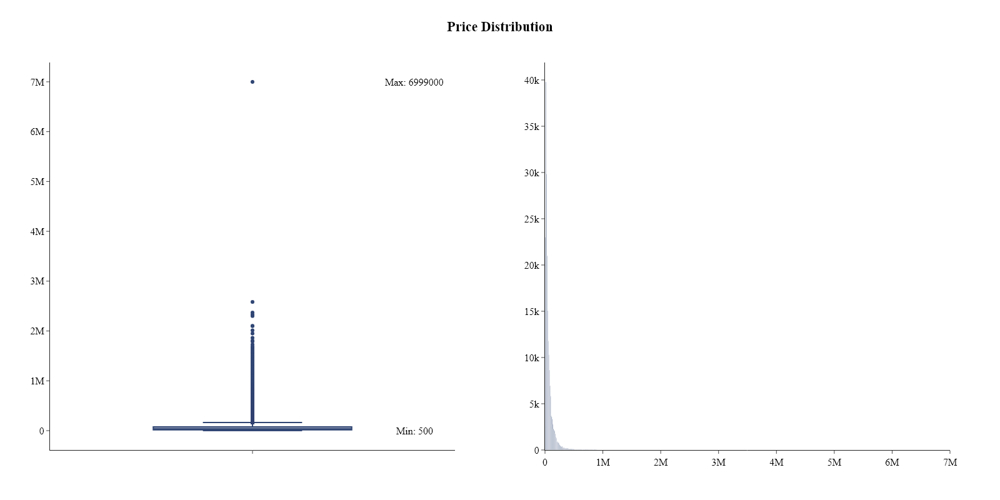

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
Price,"206,707","62,806.82","86,380.82",500.00,"6,900.00","17,700.00","35,500.00","75,900.00","199,900.00","6,999,000.00","7,461,646,901.17",7.58,255.46


In [6]:
plots.histogram_and_box_plot(data[target_feature], annotations=["Min", "Max"], bin_size=10000, plot_title="Price Distribution")
describe_numerical_feature(data, target_feature)

**Notes:**
- Price distribution is right-skewed, with most cars priced below 50,000 PLN.
- Several high-value outliers are present above 200,000 PLN.
- Median price is notably lower than the mean, indicating skewness.

**Conclusion:**
- Remove outliers in `Price` above 300,000 PLN to focus on typical car prices.
- Log-transform `Price` to normalize distribution and reduce skewness.

Rows with Price in range: 202501 (97.97%)


C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\20062260.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\20062260.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



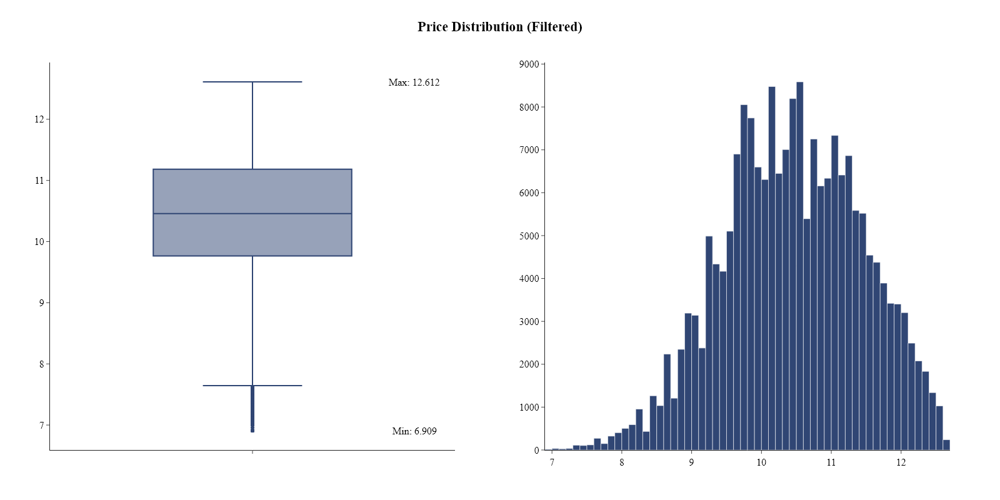

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
log_price,"202,501",10.45,0.99,6.91,8.82,9.76,10.46,11.18,12.06,12.61,0.98,-0.15,-0.37


In [7]:
price_threshold_min = 1000
price_threshold_max = 300000
mask = (data['Price'] >= price_threshold_min) & (data['Price'] <= price_threshold_max)
print(f"Rows with Price in range: {mask.sum()} ({mask.mean():.2%})")
data = data[mask]
data["log_price"] = np.log1p(data[target_feature])
data.drop(columns=[target_feature], inplace=True)
target_feature = "log_price"
plots.histogram_and_box_plot(data[target_feature], annotations=["Min", "Max"], bin_size=0.1, plot_title="Price Distribution (Filtered)")
describe_numerical_feature(data, target_feature)

## `Condition`

`Condition` (categorical) – new or used

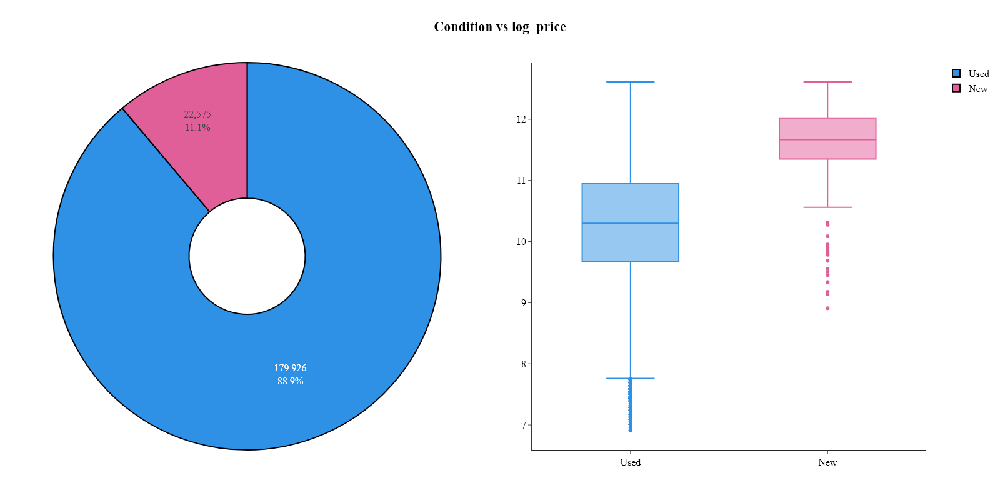

,Category,Count,Percentage (%)
0,Used,"179,926",88.85%
1,New,"22,575",11.15%


In [8]:
plots.pie_boxplot_by_categorical(data, "Condition", target_feature, plot_title=f"Condition vs {target_feature}")
describe_categorical_feature(data, "Condition")

**Notes:**
- The vast majority of cars are listed as 'used', with 'new' cars forming a small minority.
- Median price for new cars is substantially higher than for used cars.
- Price range for used cars is much wider, with more outliers on the high end.

**Conclusion:**
- Convert `Condition` to `category` dtype for efficient modeling.

In [9]:
data['Condition'] = data['Condition'].astype('category')

C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\532433716.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## `Vehicle_brand`

`Vehicle_brand` (categorical) – brand of vehicle in offer

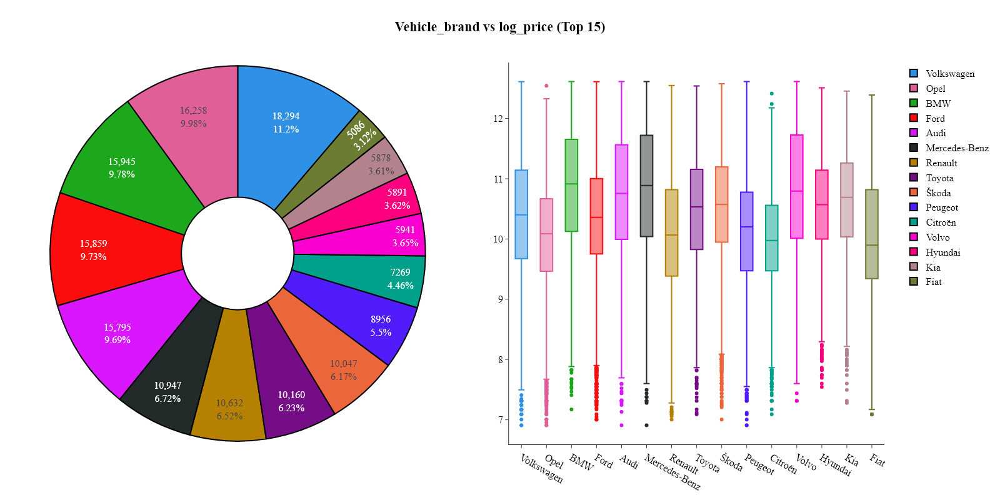

,Category,Count,Percentage (%)
0,Volkswagen,"18,294",9.03%
1,Opel,"16,258",8.03%
2,BMW,"15,945",7.87%
3,Ford,"15,859",7.83%
4,Audi,"15,795",7.80%
5,Mercedes-Benz,"10,947",5.41%
6,Renault,"10,632",5.25%
7,Toyota,"10,160",5.02%
8,Škoda,"10,047",4.96%
9,Peugeot,"8,956",4.42%


In [10]:
plots.pie_boxplot_by_categorical_top_n(data, "Vehicle_brand", target_feature, n=15, plot_title=f"Vehicle_brand vs {target_feature} (Top 15)")
describe_categorical_feature(data, "Vehicle_brand")

**Notes:**
- Median prices vary widely between brands, with some brands consistently above the overall median.
- Several brands have very few listings, contributing little to the overall distribution.

**Conclusion:**
- Group vehicle brands with less than 1% representation as 'Other'.
- Convert `Vehicle_brand` to `category` dtype.

C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\4205359874.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\4205359874.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



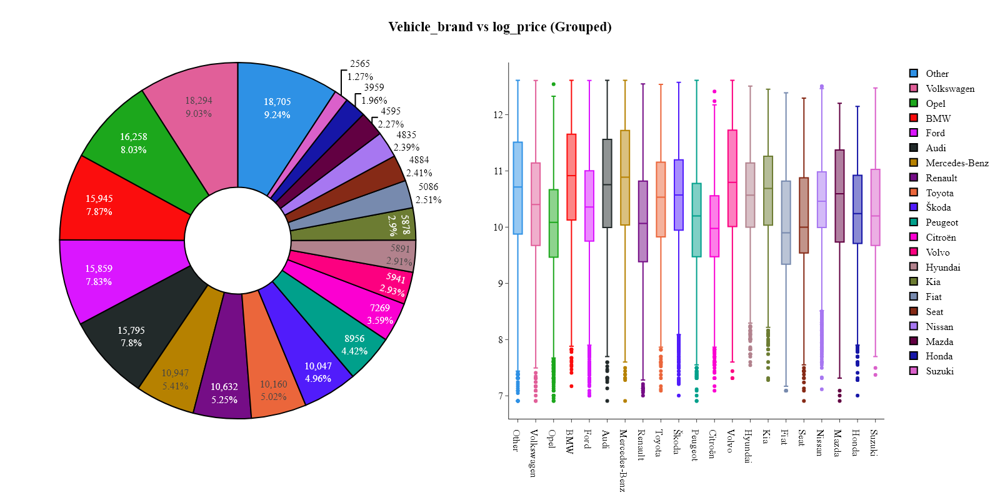

,Category,Count,Percentage (%)
0,Other,"18,705",9.24%
1,Volkswagen,"18,294",9.03%
2,Opel,"16,258",8.03%
3,BMW,"15,945",7.87%
4,Ford,"15,859",7.83%
5,Audi,"15,795",7.80%
6,Mercedes-Benz,"10,947",5.41%
7,Renault,"10,632",5.25%
8,Toyota,"10,160",5.02%
9,Škoda,"10,047",4.96%


In [11]:
brand_counts = data['Vehicle_brand'].value_counts(normalize=True)
data['Vehicle_brand'] = data['Vehicle_brand'].where(brand_counts[data['Vehicle_brand']].values >= 0.01, 'Other')
data['Vehicle_brand'] = data['Vehicle_brand'].astype('category')
plots.pie_boxplot_by_categorical(data, 'Vehicle_brand', target_feature, plot_title=f"Vehicle_brand vs {target_feature} (Grouped)")
describe_categorical_feature(data, 'Vehicle_brand')

## `Vehicle_model`

`Vehicle_model` (categorical) – model of vehicle in offer

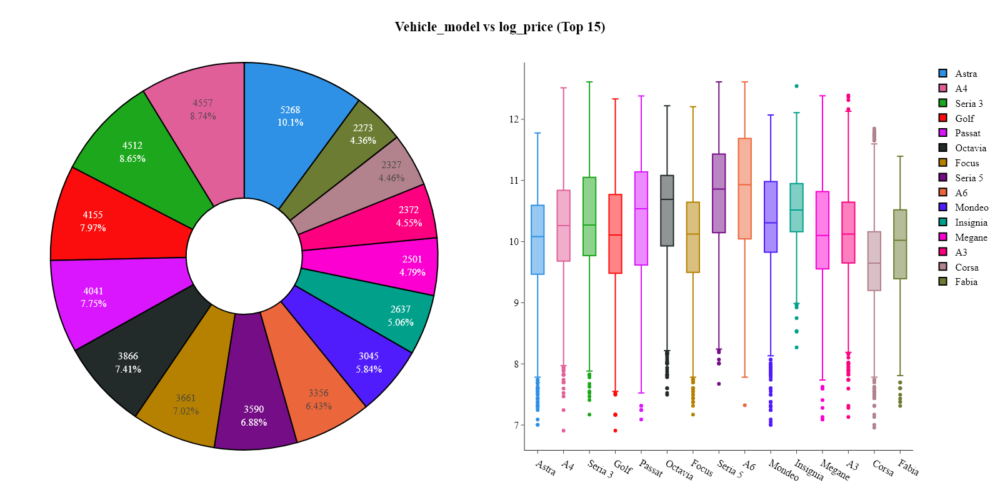

,Category,Count,Percentage (%)
0,Astra,"5,268",2.60%
1,A4,"4,557",2.25%
2,Seria 3,"4,512",2.23%
3,Golf,"4,155",2.05%
4,Passat,"4,041",2.00%
5,Octavia,"3,866",1.91%
6,Focus,"3,661",1.81%
7,Seria 5,"3,590",1.77%
8,A6,"3,356",1.66%
9,Mondeo,"3,045",1.50%


In [12]:
plots.pie_boxplot_by_categorical_top_n(data, "Vehicle_model", target_feature, n=15, plot_title=f"Vehicle_model vs {target_feature} (Top 15)")
describe_categorical_feature(data, "Vehicle_model")

**Notes:**
- Median price varies significantly across models, with some models showing much higher price ranges.
- Many models have very few listings, resulting in sparse data for those categories.

**Conclusion:**
- Convert `Vehicle_model` to `category` dtype.

In [13]:
data['Vehicle_model'] = data['Vehicle_model'].astype('category')

C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\1606299575.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## `Vehicle_generation`

`Vehicle_generation` (categorical) – generation of vehicle in offer

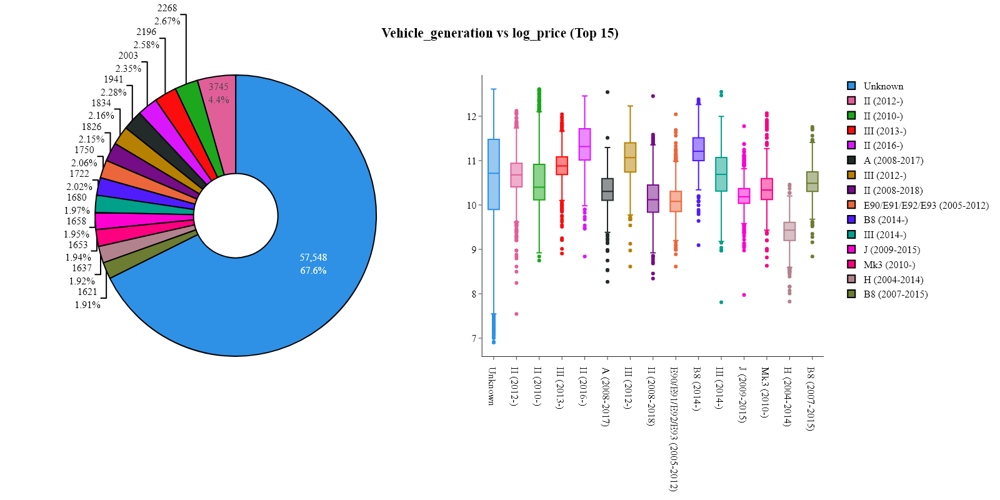

,Category,Count,Percentage (%)
0,Unknown,"57,548",28.42%
1,II (2012-),"3,745",1.85%
2,II (2010-),"2,268",1.12%
3,III (2013-),"2,196",1.08%
4,II (2016-),"2,003",0.99%
5,A (2008-2017),"1,941",0.96%
6,III (2012-),"1,834",0.91%
7,II (2008-2018),"1,826",0.90%
8,E90/E91/E92/E93 (2005-2012),"1,750",0.86%
9,B8 (2014-),"1,722",0.85%


In [14]:
plots.pie_boxplot_by_categorical_top_n(data, "Vehicle_generation", target_feature, n=15, plot_title=f"Vehicle_generation vs {target_feature} (Top 15)")
describe_categorical_feature(data, "Vehicle_generation")

**Notes:**
- Most vehicle generations have very few listings, with a small number of generations being much more common.
- Price distributions by generation show considerable spread, with some generations having higher median prices.
- The majority of generations are represented by less than 1% of the data each.

**Conclusion:**
- Drop `Vehicle_generation` due to high cardinality and low representation.

In [15]:
data.drop(columns=["Vehicle_generation"], inplace=True)

C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\3291210637.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## `Vehicle_version`

`Vehicle_version` (categorical) – version of vehicle in offer

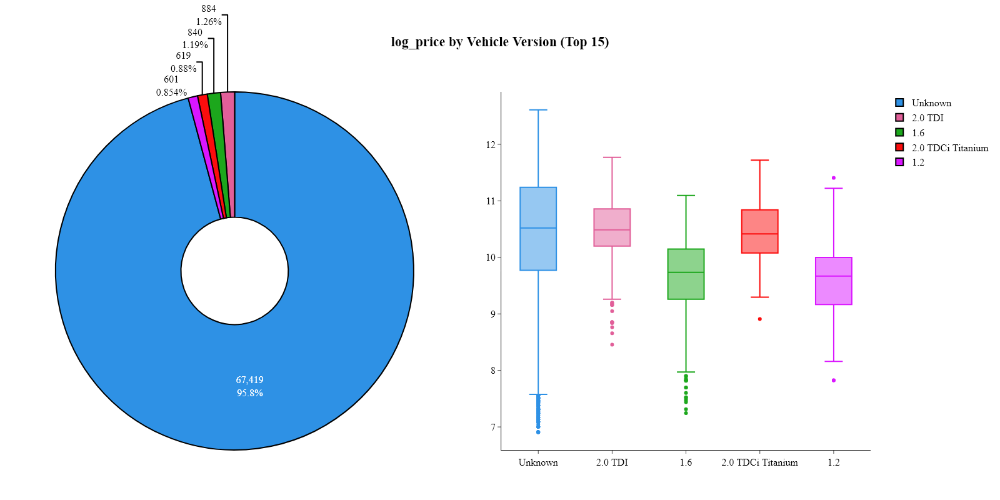

,Category,Count,Percentage (%)
0,Unknown,"67,419",33.29%
1,2.0 TDI,884,0.44%
2,1.6,840,0.41%
3,2.0 TDCi Titanium,619,0.31%
4,1.2,601,0.30%
5,1.4,600,0.30%
6,Standard,583,0.29%
7,1.9 TDI,408,0.20%
8,320d,390,0.19%
9,2.0,376,0.19%


In [16]:
plots.pie_boxplot_by_categorical_top_n(data, "Vehicle_version", target_feature, n=5, plot_title=f"{target_feature} by Vehicle Version (Top 15)")
describe_categorical_feature(data, "Vehicle_version")

**Notes:**
- The vast majority of vehicle versions have very few listings, with only a handful being common.
- Price distributions for the most common versions show wide variability.
- Most versions are rare, contributing little to the overall analysis.

**Conclusion:**
- Drop `Vehicle_version` due to high cardinality and low representation.

In [17]:
data.drop(columns=["Vehicle_version"], inplace=True)

C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\3774501144.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## `Production_year`

`Production_year` (numerical) – year of car production

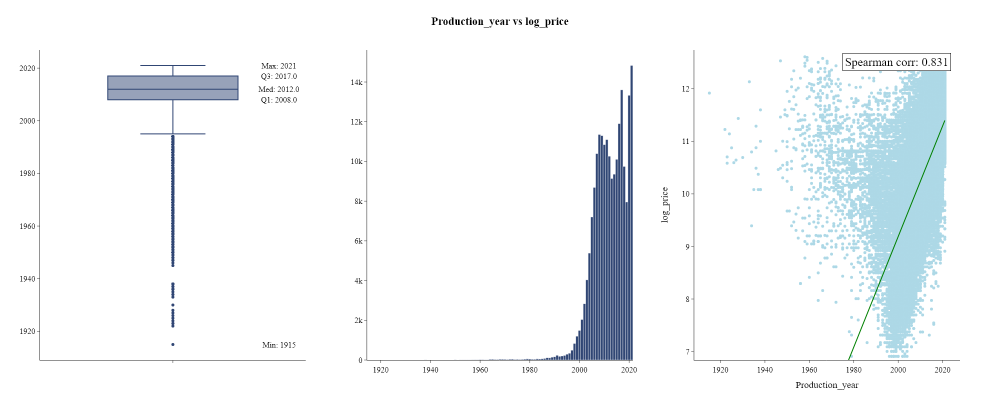

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
Production_year,"202,501","2,011.99",6.74,"1,915.00","2,002.00","2,008.00","2,012.00","2,017.00","2,021.00","2,021.00",45.46,-1.63,9.09


In [18]:
plots.histogram_boxplot_linear_regression(data, "Production_year", target_feature, annotations=True, bin_size=1, plot_title=f"Production_year vs {target_feature}")
describe_numerical_feature(data, "Production_year")

**Notes:**
- The distribution of production years has several outliers, with some cars listed as produced in the 1960s or earlier.

**Conclusion:**
- Remove cars with `Production_year` before 1985 or after 2023 to focus on realistic vehicles.

Rows with Production_year in range: 201551 (99.53%)


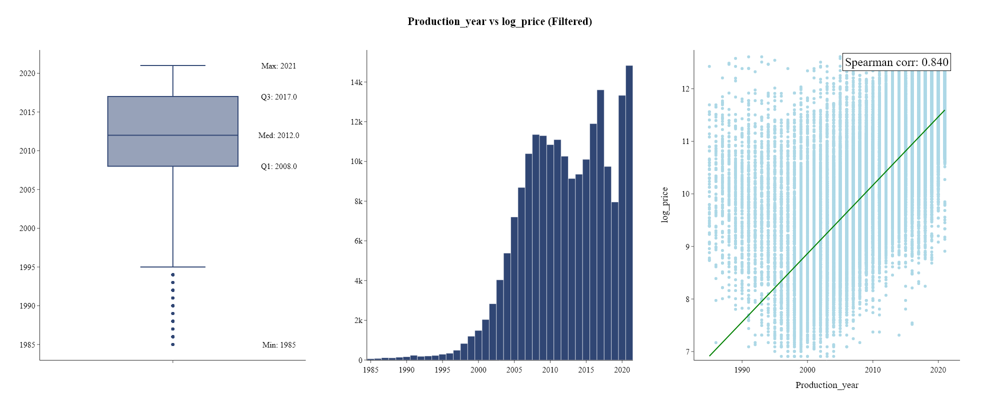

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
Production_year,"201,551","2,012.18",6.10,"1,985.00","2,002.00","2,008.00","2,012.00","2,017.00","2,021.00","2,021.00",37.15,-0.53,0.15


In [19]:
prod_year_min = 1985
prod_year_max = 2023
mask = (data['Production_year'] >= prod_year_min) & (data['Production_year'] <= prod_year_max)
print(f"Rows with Production_year in range: {mask.sum()} ({mask.mean():.2%})")
data = data[mask]
plots.histogram_boxplot_linear_regression(data, "Production_year", target_feature, annotations=True, bin_size=1, plot_title=f"Production_year vs {target_feature} (Filtered)")
describe_numerical_feature(data, "Production_year")

## `Mileage_km`

`Mileage_km` (numerical) – total distance that the car has driven in kilometers

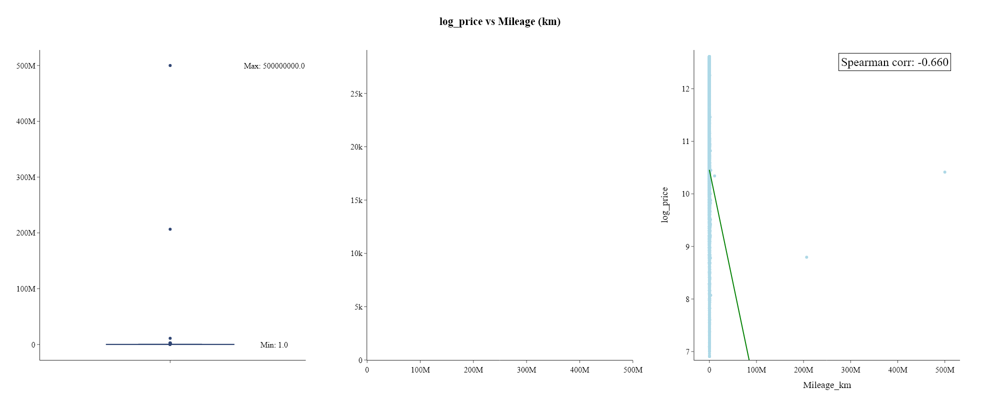

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
Mileage_km,"201,551","145,083.00","1,208,814.73",1.00,5.00,"60,300.00","147,500.00","208,000.00","295,347.50","500,000,000.00","1,461,233,045,417.45",375.52,"149,281.09"


In [20]:
plots.histogram_boxplot_linear_regression(data, "Mileage_km", target_feature, annotations=["Min", "Max"], bin_size=10000, plot_title=f"{target_feature} vs Mileage (km)")
describe_numerical_feature(data, "Mileage_km")

**Notes:**
- Mileage distribution is right-skewed, with most cars below 200,000 km.
- Several high-mileage outliers exist above 400,000 km.
- Negative correlation observed between mileage and price; higher mileage generally corresponds to lower prices.

**Conclusion:**
- Remove outliers in `Mileage_km` above 500,000 km to focus on realistic vehicle usage.

Rows with Mileage_km in range: 201346 (99.90%)


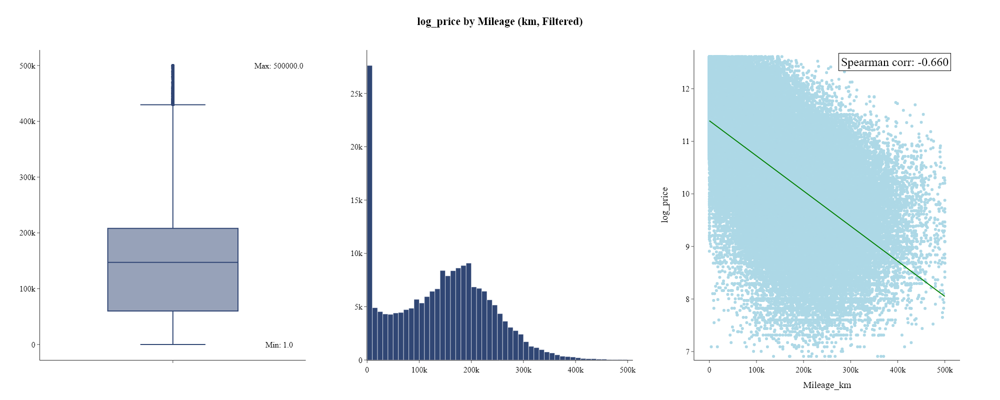

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
Mileage_km,"201,346","140,929.27","95,042.80",1.00,5.00,"60,100.00","147,200.00","208,000.00","295,000.00","500,000.00","9,033,134,744.27",0.18,-0.55


In [21]:
mileage_threshold_min = 0
mileage_threshold_max = 500000
mask = (data['Mileage_km'] >= mileage_threshold_min) & (data['Mileage_km'] <= mileage_threshold_max)
print(f"Rows with Mileage_km in range: {mask.sum()} ({mask.mean():.2%})")
data = data[mask]
plots.histogram_boxplot_linear_regression(data, 'Mileage_km', target_feature, annotations=["Min", "Max"], bin_size=10000, plot_title=f"{target_feature} by Mileage (km, Filtered)")
describe_numerical_feature(data, 'Mileage_km')

## `Power_HP`

`Power_HP` (numerical) – car engine power in horsepower

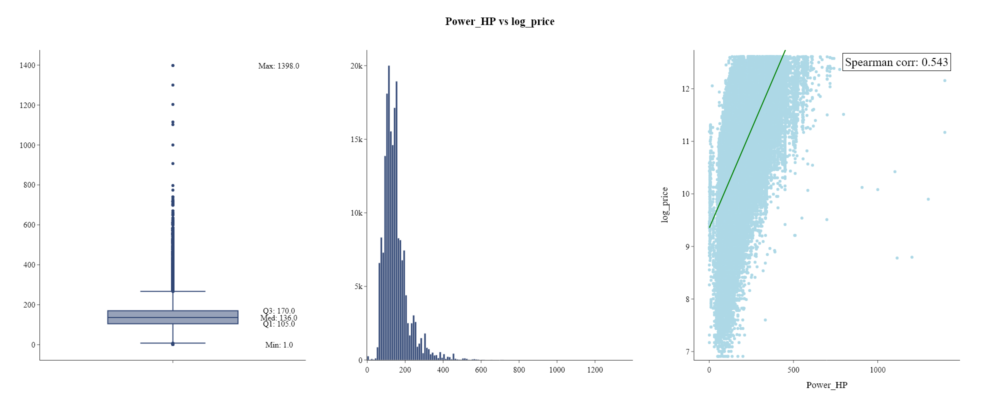

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
Power_HP,"201,346",146.86,66.90,1.00,73.00,105.00,136.00,170.00,279.00,"1,398.00","4,475.09",2.22,9.50


In [22]:
plots.histogram_boxplot_linear_regression(data, "Power_HP", target_feature, annotations=True, bin_size=10, plot_title=f"Power_HP vs {target_feature}")
describe_numerical_feature(data, "Power_HP")

**Notes:**
- Power distribution is right-skewed, with most cars having power between 70 and 280 HP.

**Conclusion:**
- Remove outliers in `Power_HP` below 40 or above 800 to focus on typical vehicles.

Rows with Power_HP in range: 200934 (99.80%)


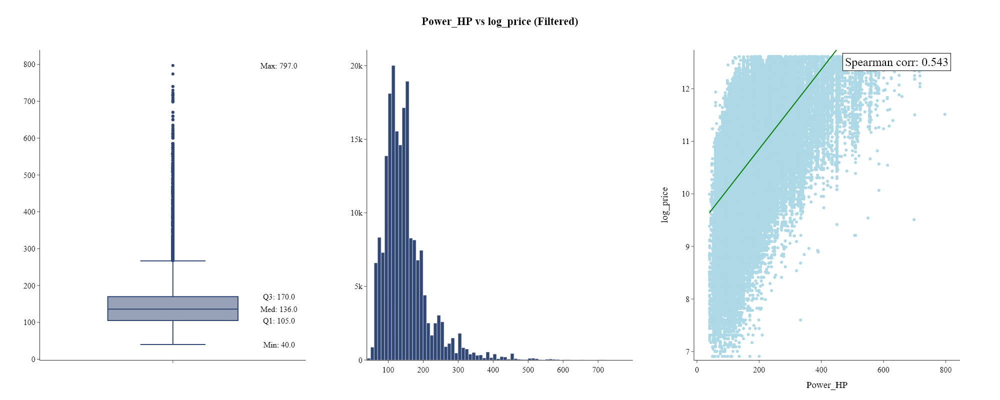

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
Power_HP,"200,934",147.09,66.36,40.00,74.00,105.00,136.00,170.00,279.00,797.00,"4,403.78",2.12,7.18


In [23]:
power_min = 40
power_max = 800
mask = (data['Power_HP'] >= power_min) & (data['Power_HP'] <= power_max)
print(f"Rows with Power_HP in range: {mask.sum()} ({mask.mean():.2%})")
data = data[mask]
plots.histogram_boxplot_linear_regression(data, "Power_HP", target_feature, annotations=True, bin_size=10, plot_title=f"Power_HP vs {target_feature} (Filtered)")
describe_numerical_feature(data, "Power_HP")

## `Displacement_cm3`

`Displacement_cm3` (numerical) – car engine size in cubic centimeters

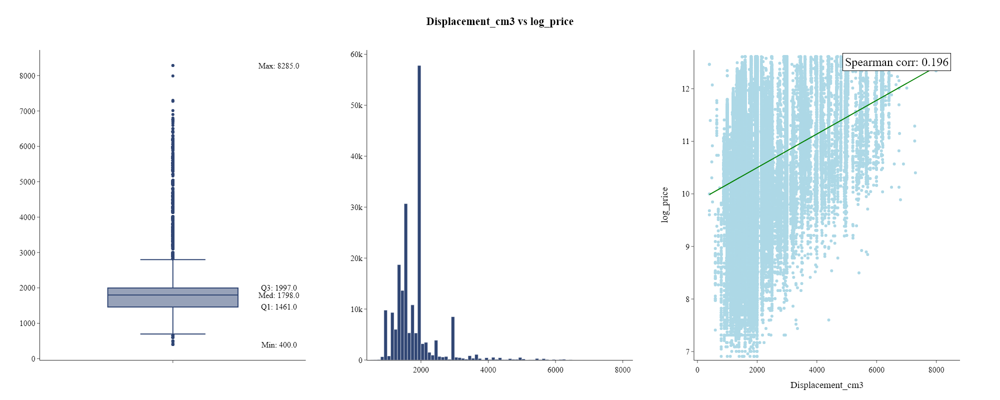

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
Displacement_cm3,"200,934","1,850.07",671.03,400.00,999.00,"1,461.00","1,798.00","1,997.00","2,993.00","8,285.00","450,287.83",2.54,10.13


In [24]:
plots.histogram_boxplot_linear_regression(data, "Displacement_cm3", target_feature, annotations=True, bin_size=100, plot_title=f"Displacement_cm3 vs {target_feature}")
describe_numerical_feature(data, "Displacement_cm3")

**Notes:**
- Engine displacement is concentrated between 1,000 and 2,000 cm³, with a long right tail.
- Several outliers exist above 3,000 cm³.
- Positive correlation observed between displacement and price, but with diminishing returns at higher values.


## `Fuel_type`

`Fuel_type` (categorical) – car fuel type

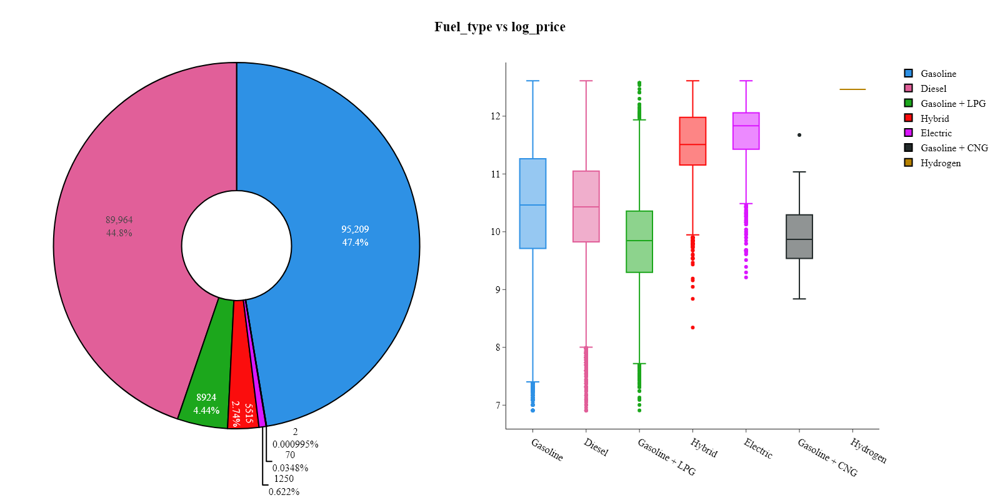

,Category,Count,Percentage (%)
0,Gasoline,"95,209",47.38%
1,Diesel,"89,964",44.77%
2,Gasoline + LPG,"8,924",4.44%
3,Hybrid,"5,515",2.74%
4,Electric,"1,250",0.62%
5,Gasoline + CNG,70,0.03%
6,Hydrogen,2,0.00%


In [25]:
plots.pie_boxplot_by_categorical(data, "Fuel_type", target_feature, plot_title=f"Fuel_type vs {target_feature}")
describe_categorical_feature(data, "Fuel_type")

**Notes:**

**Conclusion:**
- Group fuel types with less than 1% representation as 'Other'.
- Convert `Fuel_type` to `category` dtype.

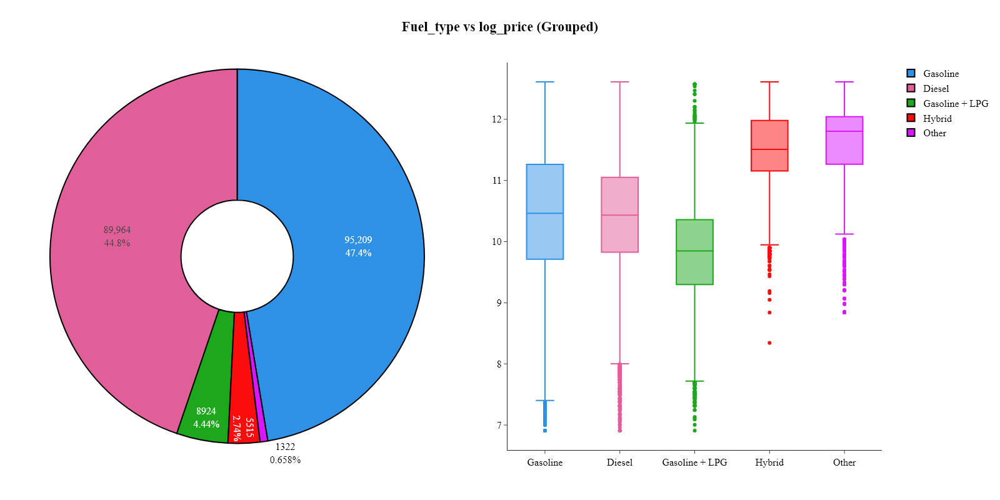

,Category,Count,Percentage (%)
0,Gasoline,"95,209",47.38%
1,Diesel,"89,964",44.77%
2,Gasoline + LPG,"8,924",4.44%
3,Hybrid,"5,515",2.74%
4,Other,"1,322",0.66%


In [26]:
fuel_counts = data['Fuel_type'].value_counts(normalize=True)
data['Fuel_type'] = data['Fuel_type'].where(fuel_counts[data['Fuel_type']].values >= 0.01, 'Other')
data['Fuel_type'] = data['Fuel_type'].astype('category')
plots.pie_boxplot_by_categorical(data, 'Fuel_type', target_feature, plot_title=f"Fuel_type vs {target_feature} (Grouped)")
describe_categorical_feature(data, 'Fuel_type')

## `Drive`

`Drive` (categorical) – type of car drive

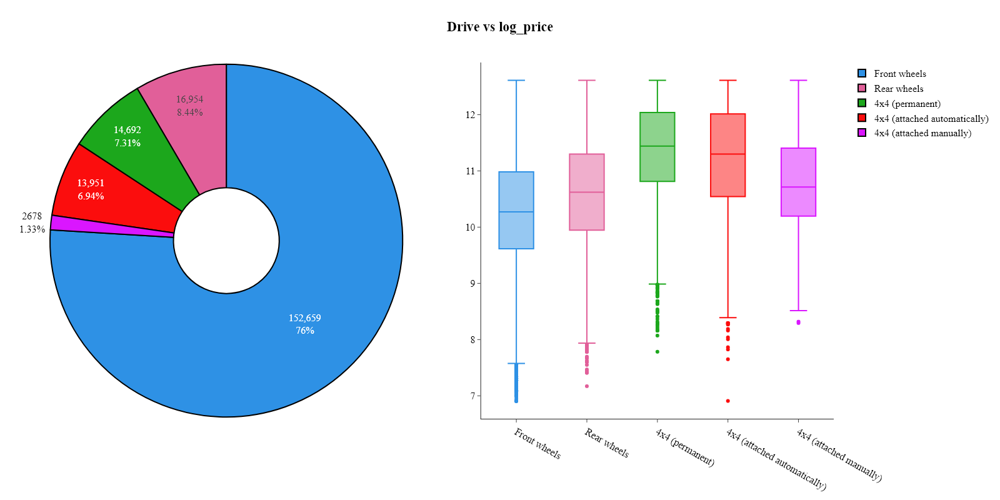

,Category,Count,Percentage (%)
0,Front wheels,"152,659",75.97%
1,Rear wheels,"16,954",8.44%
2,4x4 (permanent),"14,692",7.31%
3,4x4 (attached automatically),"13,951",6.94%
4,4x4 (attached manually),"2,678",1.33%


In [27]:
plots.pie_boxplot_by_categorical(data, "Drive", target_feature, plot_title=f"Drive vs {target_feature}")
describe_categorical_feature(data, "Drive")

**Notes:**
- The majority of cars have front-wheel drive, with rear-wheel and all-wheel drive being less common.
- Median price is higher for all-wheel drive vehicles compared to other types.
- Price range is widest for all-wheel drive cars, indicating greater variability.

**Conclusion:**
- Convert `Drive` to `category` dtype for efficient modeling.

In [28]:
data['Drive'] = data['Drive'].astype('category')

## `Transmission`

`Transmission` (categorical) – type of car transmission

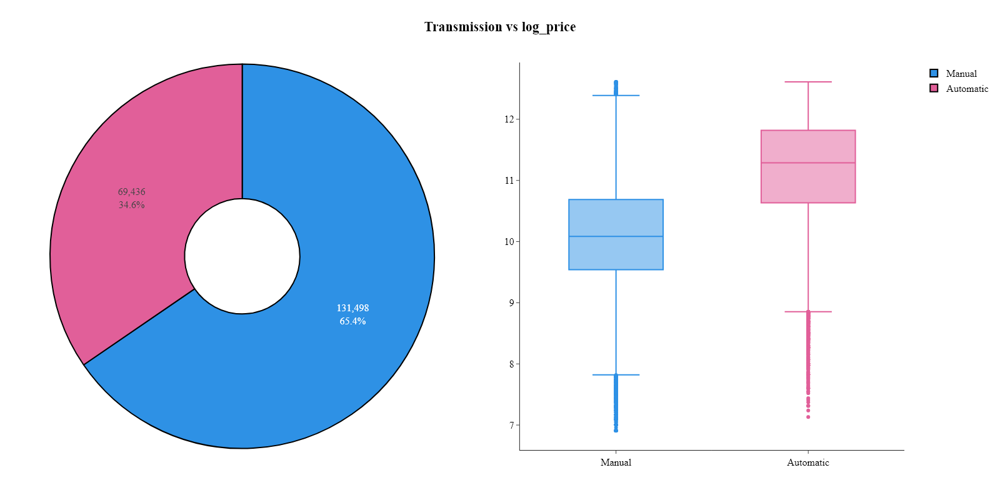

,Category,Count,Percentage (%)
0,Manual,"131,498",65.44%
1,Automatic,"69,436",34.56%


In [29]:
plots.pie_boxplot_by_categorical(data, "Transmission", target_feature, plot_title=f"Transmission vs {target_feature}")
describe_categorical_feature(data, "Transmission")

**Notes:**
- The majority of cars have manual transmission, with automatic being less common.

**Conclusion:**
- Convert `Transmission` to `category` dtype for efficient modeling.

In [30]:
data['Transmission'] = data['Transmission'].astype('category')

## `Type`

`Type` (categorical) – car body style

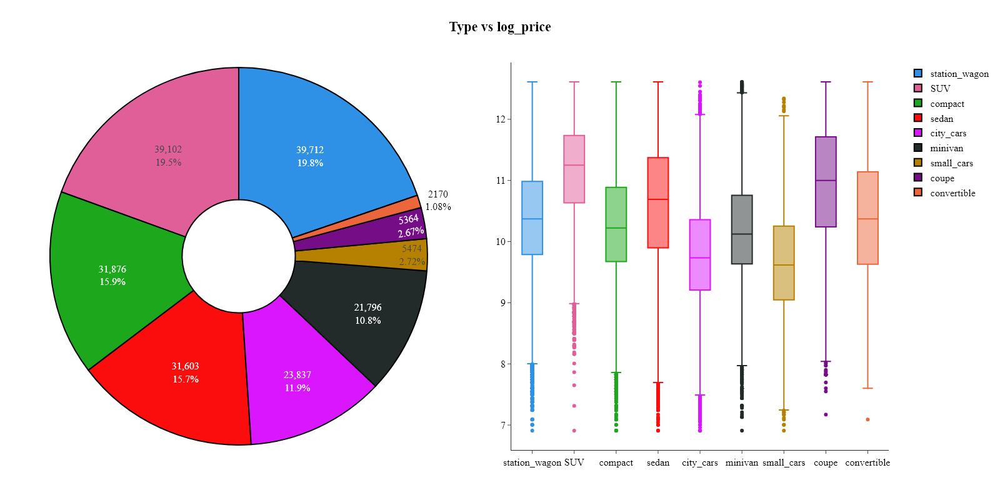

,Category,Count,Percentage (%)
0,station_wagon,"39,712",19.76%
1,SUV,"39,102",19.46%
2,compact,"31,876",15.86%
3,sedan,"31,603",15.73%
4,city_cars,"23,837",11.86%
5,minivan,"21,796",10.85%
6,small_cars,"5,474",2.72%
7,coupe,"5,364",2.67%
8,convertible,"2,170",1.08%


In [31]:
plots.pie_boxplot_by_categorical(data, "Type", target_feature, plot_title=f"Type vs {target_feature}")
describe_categorical_feature(data, "Type")

**Notes:**
- The most common body style is 'sedan', followed by 'hatchback' and 'SUV'.
- Median price varies by type, with SUVs and coupes generally commanding higher prices.
- Some types, such as convertibles and vans, are much less frequent in the dataset.

**Conclusion:**
- Convert `Type` to `category` dtype.

In [32]:
data['Type'] = data['Type'].astype('category')

## `Doors_number`

`Doors_number` (categorical) – number of car doors

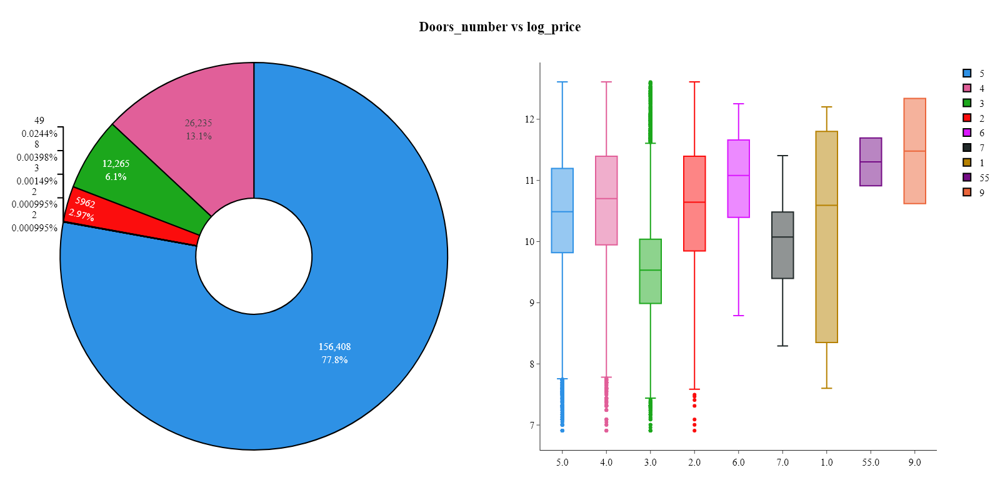

,Category,Count,Percentage (%)
0,5.000000,"156,408",77.84%
1,4.000000,"26,235",13.06%
2,3.000000,"12,265",6.10%
3,2.000000,"5,962",2.97%
4,6.000000,49,0.02%
5,7.000000,8,0.00%
6,1.000000,3,0.00%
7,9.000000,2,0.00%
8,55.000000,2,0.00%


In [33]:
plots.pie_boxplot_by_categorical(data, "Doors_number", target_feature, plot_title=f"Doors_number vs {target_feature}")
describe_categorical_feature(data, "Doors_number")

**Notes:**
- Most cars have either 4 or 5 doors, with 3-door cars being less common.
- Median price is slightly higher for cars with more doors.
- Distribution is left-skewed, with very few cars having only 2 doors.

**Conclusion:**
- Convert `Doors_number` to `int` dtype as it represents number of doors so it has some sort of order.
- Remove rows with `Doors_number` as `55` as it appears to be an error.

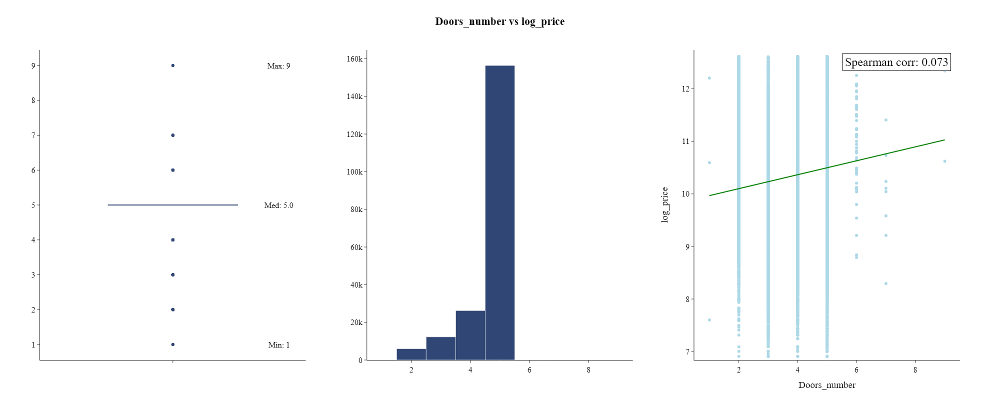

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
Doors_number,"200,932",4.66,0.73,1.00,3.00,5.00,5.00,5.00,5.00,9.00,0.53,-2.21,4.18


In [34]:
data['Doors_number'] = data['Doors_number'].astype('int')
mask = data['Doors_number'] != 55
data = data[mask]
plots.histogram_boxplot_linear_regression(data, "Doors_number", target_feature, annotations=["Min", "Med", "Max"], bin_size=1, plot_title=f"Doors_number vs {target_feature}")
describe_numerical_feature(data, "Doors_number")

## `Colour`

`Colour` (categorical) – car body color

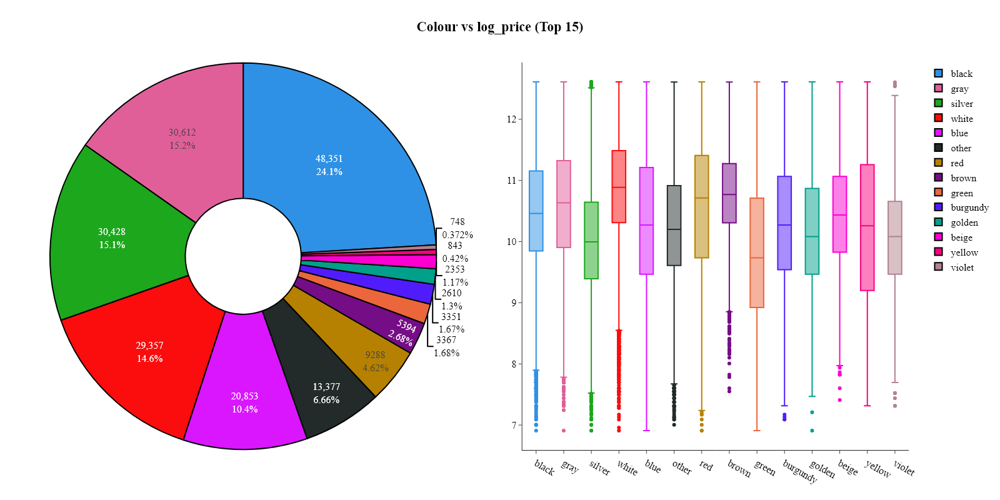

,Category,Count,Percentage (%)
0,black,"48,351",24.06%
1,gray,"30,612",15.24%
2,silver,"30,428",15.14%
3,white,"29,357",14.61%
4,blue,"20,853",10.38%
5,other,"13,377",6.66%
6,red,"9,288",4.62%
7,brown,"5,394",2.68%
8,green,"3,367",1.68%
9,burgundy,"3,351",1.67%


In [35]:
plots.pie_boxplot_by_categorical_top_n(data, "Colour", target_feature, n=15, plot_title=f"Colour vs {target_feature} (Top 15)")
describe_categorical_feature(data, "Colour")

**Notes:**
- The most common car colors are black, white, and grey, together making up over half of listings.
- Some colors, such as red and blue, are less frequent but still present in notable numbers.
- Median price does not vary substantially between the most common colors.

**Conclusion:**
- Convert `Colour` to `category` dtype.

In [36]:
data['Colour'] = data['Colour'].astype('category')

## `Origin_country`

`Origin_country` (categorical) – country of origin of the car

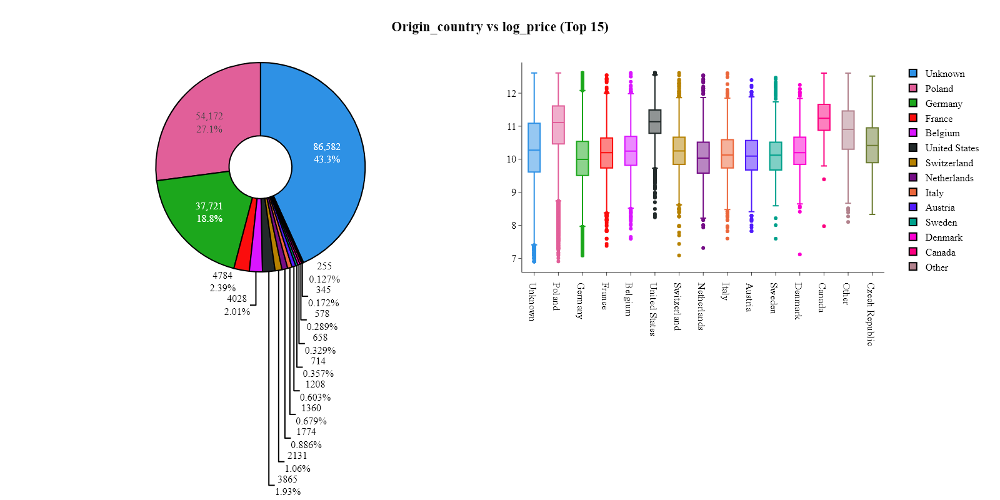

,Category,Count,Percentage (%)
0,Unknown,"86,582",43.09%
1,Poland,"54,172",26.96%
2,Germany,"37,721",18.77%
3,France,"4,784",2.38%
4,Belgium,"4,028",2.00%
5,United States,"3,865",1.92%
6,Switzerland,"2,131",1.06%
7,Netherlands,"1,774",0.88%
8,Italy,"1,360",0.68%
9,Austria,"1,208",0.60%


In [37]:
plots.pie_boxplot_by_categorical_top_n(data, "Origin_country", target_feature, n=15, plot_title=f"Origin_country vs {target_feature} (Top 15)")
describe_categorical_feature(data, "Origin_country")

**Notes:**
- The majority of cars originate from a small number of countries, with Germany being the most common.
- Median price varies by country, with German and Japanese cars generally priced higher.
- Several countries have very few listings, contributing little to the overall distribution.

**Conclusion:**
- Group countries with less than 1% representation as 'Other'.
- Convert `Origin_country` to `category` dtype.

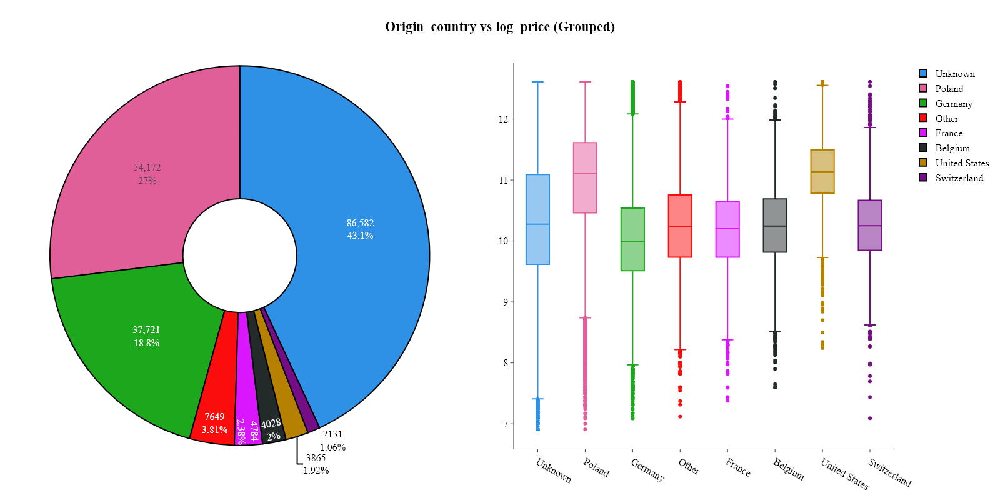

,Category,Count,Percentage (%)
0,Unknown,"86,582",43.09%
1,Poland,"54,172",26.96%
2,Germany,"37,721",18.77%
3,Other,"7,649",3.81%
4,France,"4,784",2.38%
5,Belgium,"4,028",2.00%
6,United States,"3,865",1.92%
7,Switzerland,"2,131",1.06%


In [38]:
country_counts = data['Origin_country'].value_counts(normalize=True)
data['Origin_country'] = data['Origin_country'].where(country_counts[data['Origin_country']].values >= 0.01, 'Other')
data['Origin_country'] = data['Origin_country'].astype('category')
plots.pie_boxplot_by_categorical(data, 'Origin_country', target_feature, plot_title=f"Origin_country vs {target_feature} (Grouped)")
describe_categorical_feature(data, 'Origin_country')

## `First_registration_date`

`First_registration_date` (time series) – date of first registration

C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\328205433.py:1: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



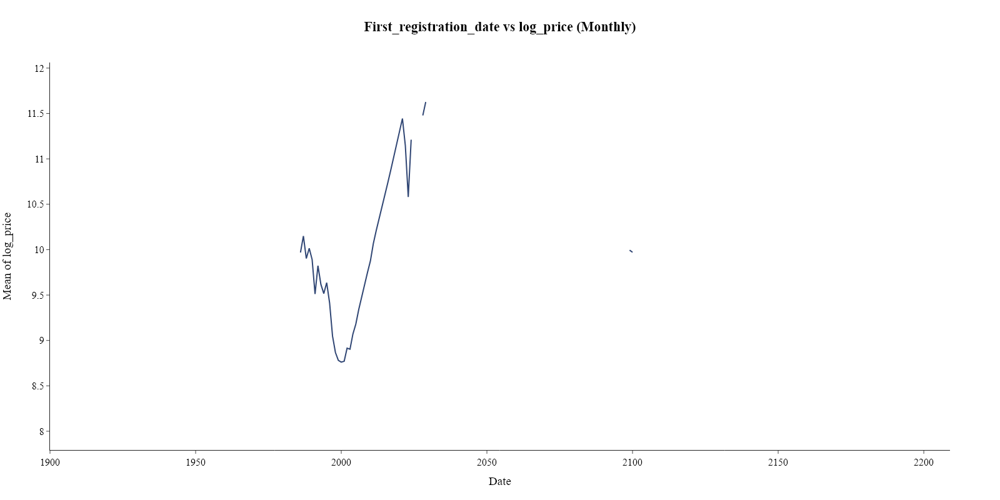

,Year,Count
0,1899,1
1,1931,1
2,1944,1
3,1950,1
4,1970,4
5,1983,1
6,1985,11
7,1986,18
8,1987,24
9,1988,28


In [39]:
data["First_registration_date"] = pd.to_datetime(data["First_registration_date"], errors='coerce', dayfirst=True)
plots.plot_time_series_mean(data, "First_registration_date", target_feature, agg_freq='YE', plot_title=f"First_registration_date vs {target_feature} (Monthly)")
describe_time_series_feature(data, "First_registration_date", agg_freq='YE')

**Notes:**
- Most cars were first registered in the last 10–15 years, with a peak in recent years.
- Median price is higher for cars with more recent registration years.
- A small number of cars have missing or unknown registration dates.

**Conclusion:**
- Create new features from `First_registration_date`:
  - `First_registration_year`: year of first registration
  - `First_registration_month`: month of first registration
- Both features should be converted to `category` dtype for efficient modeling.
- Thanks to `category` dtype we will keep missing values in those features as a separate category.
- Remove `First_registration_date` as it is no longer needed.

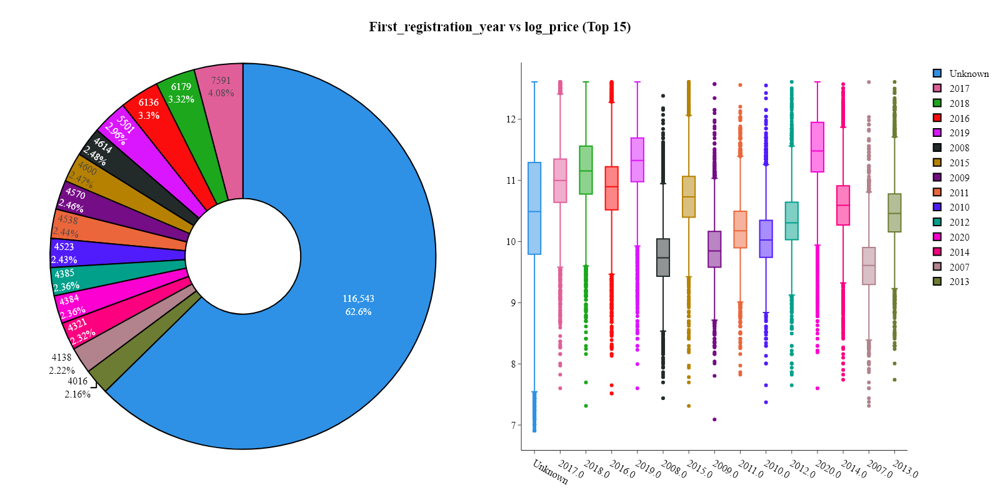

,Category,Count,Percentage (%)
0,Unknown,"116,543",58.00%
1,2017.000000,"7,591",3.78%
2,2018.000000,"6,179",3.08%
3,2016.000000,"6,136",3.05%
4,2019.000000,"5,501",2.74%
5,2008.000000,"4,614",2.30%
6,2015.000000,"4,600",2.29%
7,2009.000000,"4,570",2.27%
8,2011.000000,"4,538",2.26%
9,2010.000000,"4,523",2.25%


In [40]:
data['First_registration_year'] = data['First_registration_date'].dt.year.astype('object')
data['First_registration_year'] = data['First_registration_year'].fillna("Unknown").astype('category')
data['First_registration_month'] = data['First_registration_date'].dt.month.astype('object')
data['First_registration_month'] = data['First_registration_month'].fillna("Unknown").astype('category')
plots.pie_boxplot_by_categorical_top_n(data, 'First_registration_year', target_feature, n=15, plot_title=f"First_registration_year vs {target_feature} (Top 15)")
describe_categorical_feature(data, 'First_registration_year')

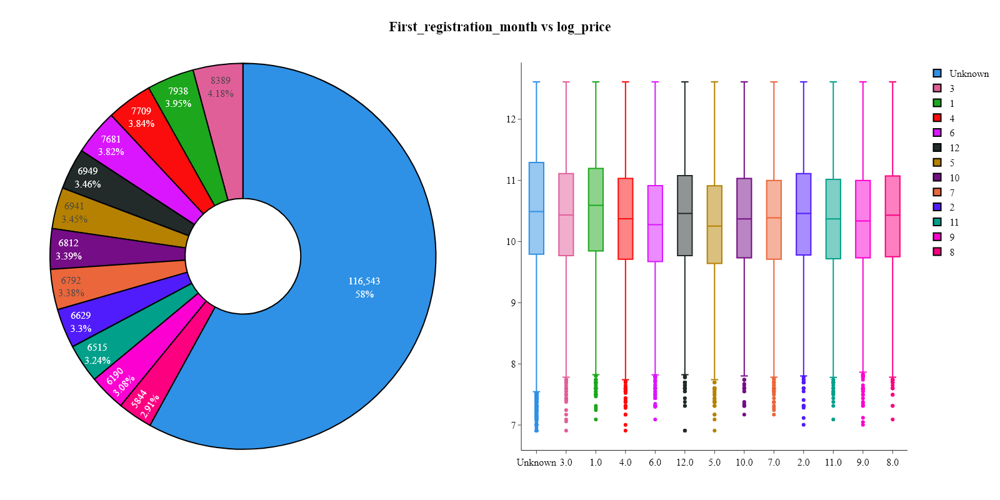

,Category,Count,Percentage (%)
0,Unknown,"116,543",58.00%
1,3.000000,"8,389",4.18%
2,1.000000,"7,938",3.95%
3,4.000000,"7,709",3.84%
4,6.000000,"7,681",3.82%
5,12.000000,"6,949",3.46%
6,5.000000,"6,941",3.45%
7,10.000000,"6,812",3.39%
8,7.000000,"6,792",3.38%
9,2.000000,"6,629",3.30%


In [41]:
plots.pie_boxplot_by_categorical(data, 'First_registration_month', target_feature, plot_title=f"First_registration_month vs {target_feature}")
describe_categorical_feature(data, 'First_registration_month')

In [42]:
data.drop(columns=["First_registration_date"], inplace=True)

## `Offer_publication_date`

`Offer_publication_date` (time series) – date of publication of the offer

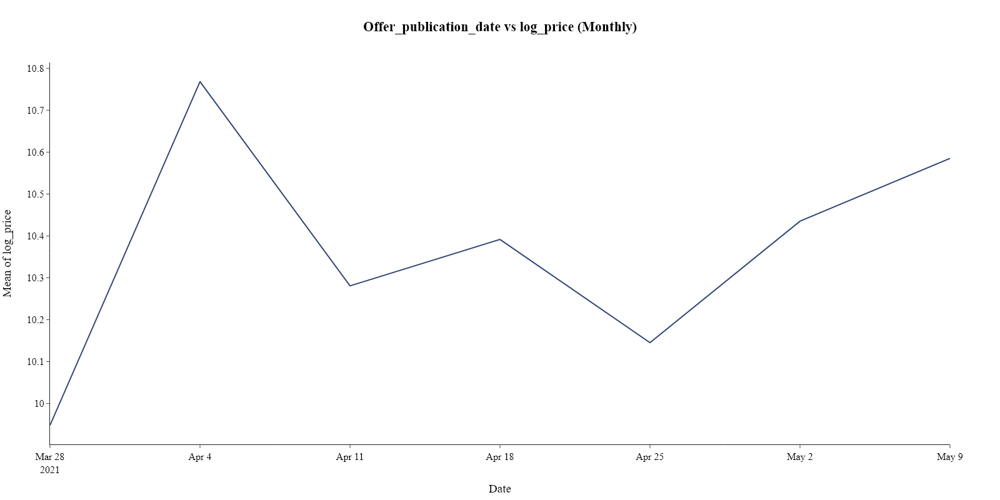

,Week,Count
0,12,4
1,13,14
2,14,68
3,15,174
4,16,"14,404"
5,17,"136,075"
6,18,"50,193"


In [43]:
data["Offer_publication_date"] = pd.to_datetime(data["Offer_publication_date"], errors='coerce', dayfirst=True)
plots.plot_time_series_mean(data, "Offer_publication_date", target_feature, agg_freq='W', plot_title=f"Offer_publication_date vs {target_feature} (Monthly)")
describe_time_series_feature(data, "Offer_publication_date", agg_freq='W')

**Notes:**
- Offers are distributed fairly evenly across days of the month, with no single day dominating.
- Median price does not show strong variation by publication day.
- A small number of offers have unknown or missing publication days.

**Conclusion:**
- Create new features from `Offer_publication_date`:
  - `Offer_publication_day`: day of publication
  - `Offer_publication_weekday`: weekday of publication
- Both features should be converted to `category` dtype for efficient modeling.
- Remove `Offer_publication_date` as it is no longer needed.

C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\446803397.py:2: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



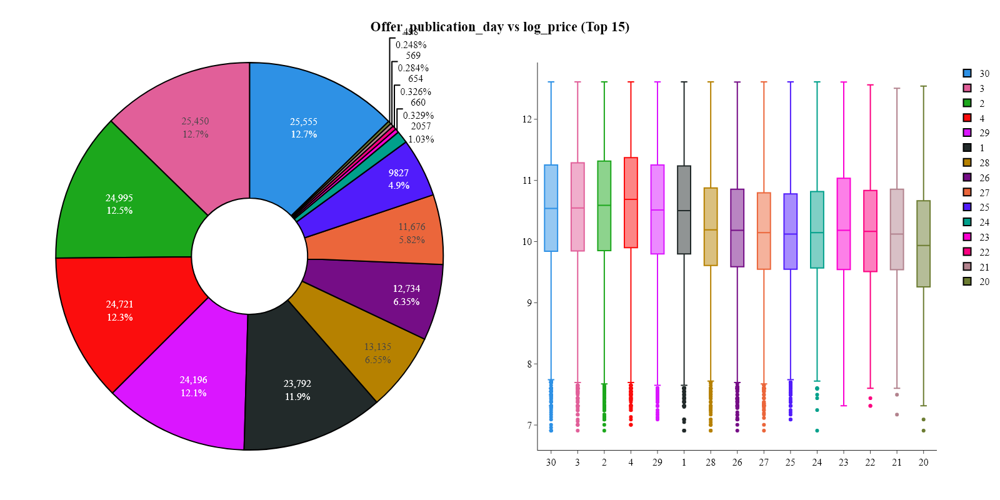

,Category,Count,Percentage (%)
0,30,"25,555",12.72%
1,3,"25,450",12.67%
2,2,"24,995",12.44%
3,4,"24,721",12.30%
4,29,"24,196",12.04%
5,1,"23,792",11.84%
6,28,"13,135",6.54%
7,26,"12,734",6.34%
8,27,"11,676",5.81%
9,25,"9,827",4.89%


In [44]:
data['Offer_publication_day'] = data['Offer_publication_date'].dt.day.astype('object')
data['Offer_publication_day'] = data['Offer_publication_day'].fillna("Unknown").astype('category')
data['Offer_publication_weekday'] = data['Offer_publication_date'].dt.day_name().astype('object')
data['Offer_publication_weekday'] = data['Offer_publication_weekday'].fillna("Unknown").astype('category')
plots.pie_boxplot_by_categorical_top_n(data, 'Offer_publication_day', target_feature, n=15, plot_title=f"Offer_publication_day vs {target_feature} (Top 15)")
describe_categorical_feature(data, 'Offer_publication_day')

**Notes:**

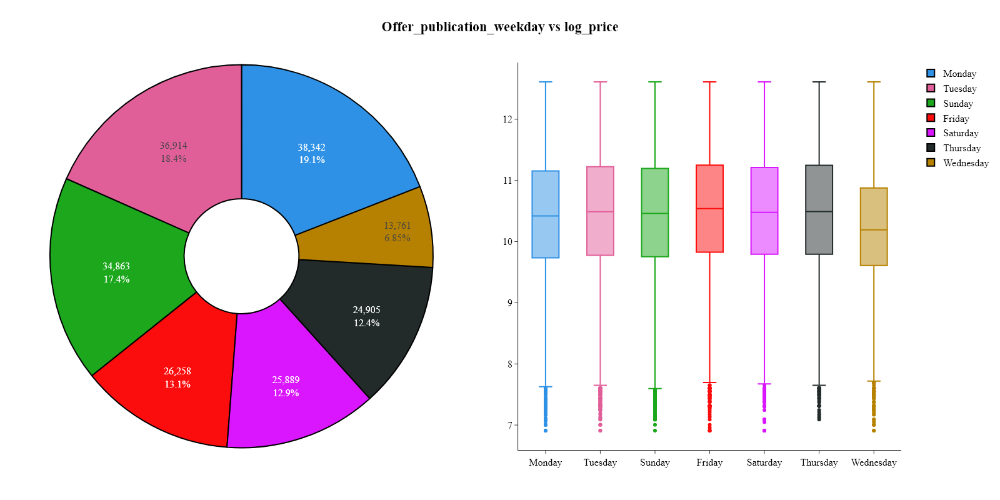

,Category,Count,Percentage (%)
0,Monday,"38,342",19.08%
1,Tuesday,"36,914",18.37%
2,Sunday,"34,863",17.35%
3,Friday,"26,258",13.07%
4,Saturday,"25,889",12.88%
5,Thursday,"24,905",12.39%
6,Wednesday,"13,761",6.85%


In [45]:
plots.pie_boxplot_by_categorical(data, 'Offer_publication_weekday', target_feature, plot_title=f"Offer_publication_weekday vs {target_feature}")
describe_categorical_feature(data, 'Offer_publication_weekday')

**Notes:**
- The number of offers is highest on Mondays and lowest on Sundays.
- Median price is relatively stable across weekdays, with minor fluctuations.
- No single weekday stands out as having significantly higher or lower prices.

## `Offer_location`

`Offer_location` (textual) – address provided by the issuer

Number of unique locations: 13521
Most common locations:
Offer_location
Radom, Mazowieckie                                                              1192
Stalowa 16 - 41-506 Chorzów, Śląskie (Polska)                                   1184
Kielce, Świętokrzyskie                                                          1094
Lublin, Lubelskie                                                               1059
Bydgoszcz, Kujawsko-pomorskie                                                    887
Okulickiego 3B - 05-500 Piaseczno, piaseczyński, Mazowieckie (Polska)            821
Rzeszów, Podkarpackie                                                            795
ul. Stalowa 16 - 41-506 Chorzów, Śląskie (Polska)                                767
Płock, Mazowieckie                                                               766
Ostrów Wielkopolski, ostrowski, Wielkopolskie                                    667
Bielsko-Biała, Śląskie                                                        

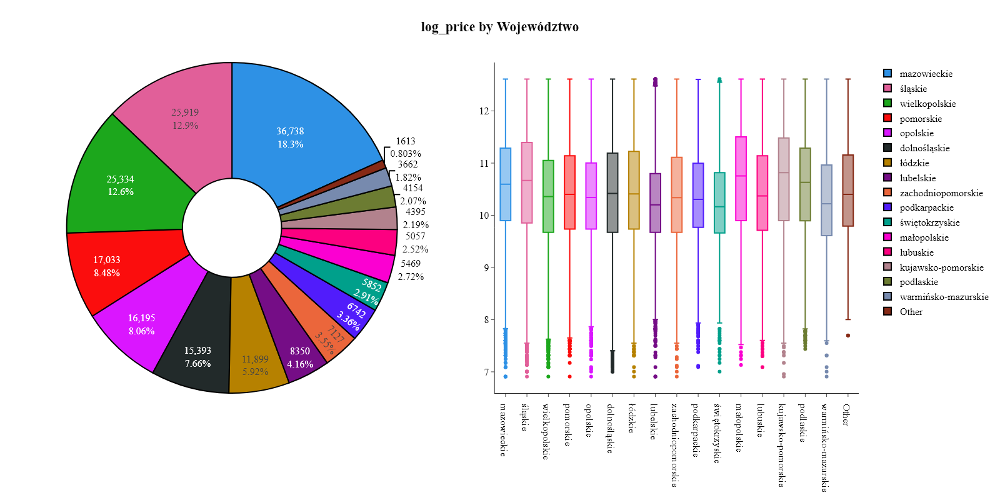

,Category,Count,Percentage (%)
0,mazowieckie,"36,738",18.28%
1,śląskie,"25,919",12.90%
2,wielkopolskie,"25,334",12.61%
3,pomorskie,"17,033",8.48%
4,opolskie,"16,195",8.06%
5,dolnośląskie,"15,393",7.66%
6,łódzkie,"11,899",5.92%
7,lubelskie,"8,350",4.16%
8,zachodniopomorskie,"7,127",3.55%
9,podkarpackie,"6,742",3.36%


In [46]:
print(f"Number of unique locations: {data['Offer_location'].nunique()}")
print(f"Most common locations:\n{data['Offer_location'].value_counts().head(30)}")
print(f"Number of locations with only one offer: {(data['Offer_location'].value_counts() == 1).sum()}")

wojewodztwa = ["mazowieckie", "zachodniopomorskie", "pomorskie", "wielkopolskie", "dolnośląskie", "śląskie", "lubelskie", "łódzkie", "kujawsko-pomorskie", "podlaskie", "lubuskie", "podkarpackie", "opolskie", "warmińsko-mazurskie", "świętokrzyskie", "małopolskie"]
miasta_wojewodztwa_map = {
    "mazowieckie": ["Warszawa", "Radom", "Płock", "Ostrołęka", "Siedlce"],
    "pomorskie": ["Gdańsk", "Gdynia", "Sopot", "Elbląg"],
    "wielkopolskie": ["Poznań", "Kalisz", "Konin"],
    "dolnośląskie": ["Wrocław", "Legnica", "Wałbrzych"],
    "śląskie": ["Katowice", "Częstochowa", "Gliwice"],
    "lubelskie": ["Lublin", "Chełm"],
    "łódzkie": ["Łódź", "Piotrków Trybunalski"],
    "kujawsko-pomorskie": ["Bydgoszcz", "Toruń"],
    "podlaskie": ["Białystok"],
    "zachodniopomorskie": ["Szczecin"],
    "lubuskie": ["Zielona Góra", "Gorzów Wielkopolski"],
    "podkarpackie": ["Rzeszów"],
    "opolskie": ["Opole"],
    "warmińsko-mazurskie": ["Olsztyn"],
    "świętokrzyskie": ["Kielce"],
    "małopolskie": ["Kraków"]
}
data['wojewodztwo'] = data['Offer_location'].str.lower().apply(lambda x: next((woj for woj in wojewodztwa if woj in x), 'Other'))

for woj, miasta in miasta_wojewodztwa_map.items():
    for miasto in miasta:
        data.loc[data['Offer_location'].str.contains(miasto, case=False, na=False), 'wojewodztwo'] = woj

# print(data.loc[data['wojewodztwo'] == 'Other', ['Offer_location', 'wojewodztwo']].tail(10))
plots.pie_boxplot_by_categorical(data, 'wojewodztwo', target_feature, plot_title=f"{target_feature} by Województwo")
describe_categorical_feature(data, 'wojewodztwo', top_n=16)

**Notes:**
- The most common regions are Mazowieckie and Śląskie, each with a large share of listings.
- Median price varies by region, with Mazowieckie and Małopolskie showing higher median prices.
- Some regions have very few listings, contributing little to the overall distribution.

**Conclusion:**
- Use `wojewodztwo` as a regional feature for modeling instead of raw `Offer_location`.
- Convert `wojewodztwo` to `category` dtype for efficient modeling.
- Drop `Offer_location` to reduce dimensionality.

In [47]:
data['wojewodztwo'] = data['wojewodztwo'].astype('category')
data = data.drop(columns=['Offer_location'])

## `Features`

`Features` (textual) – listed car features (ABS, airbag, parking sensors e.t.c)

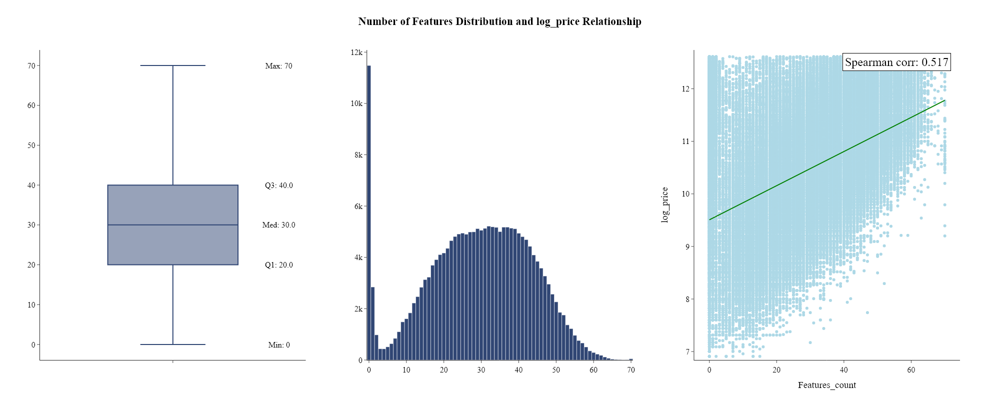


Analysis of individual features:


ABS                                181789
Central locking                    180536
Electric front windows             176797
Drivers airbag                     176306
Power steering                     176036
Passengers airbag                  174427
Electrically adjustable mirrors    168877
Factory radio                      165208
Immobilizer                        164666
On-board computer                  150430
ESP(stabilization of the track)    140080
Alloy wheels                       139436
CD                                 136246
ASR (traction control)             134350
Multifunction steering wheel       134069
Automatic air conditioning         129934
Isofix                             129876
Front side airbags                 126642
Fog lights                         124545
Electric rear windows              121452
Name: count, dtype: int64

In [48]:
data['Features_count'] = data['Features'].fillna('[]').apply(lambda x: len(ast.literal_eval(x)) if x and x != '[]' else 0)
plots.histogram_boxplot_linear_regression(data, 'Features_count', target_feature, annotations=True, bin_size=1, plot_title=f"Number of Features Distribution and {target_feature} Relationship")

print("\nAnalysis of individual features:")
all_features = []
for features_str in data['Features'].dropna():
    try:
        features_list = ast.literal_eval(features_str)
        if isinstance(features_list, list):
            all_features.extend([f.strip() for f in features_list])
    except Exception:
        print(f"Error parsing features: {features_str}")
        continue

feature_counts = pd.Series(all_features).value_counts()
feature_counts.head(20)

**Notes:**
- The number of features per car is right-skewed, with most cars having between 5 and 15 features.
- Median price increases with the number of features, but the effect plateaus at higher counts.
- A small number of cars have very few or no features listed.

**Conclusion:**
- Use `Features_count` column as a numerical feature for modeling.
- Extract some most frequent features (that occurs in at least 50% of offers) as separate binary features for modeling.
- Drop `Features` column as it will not be used in modeling.

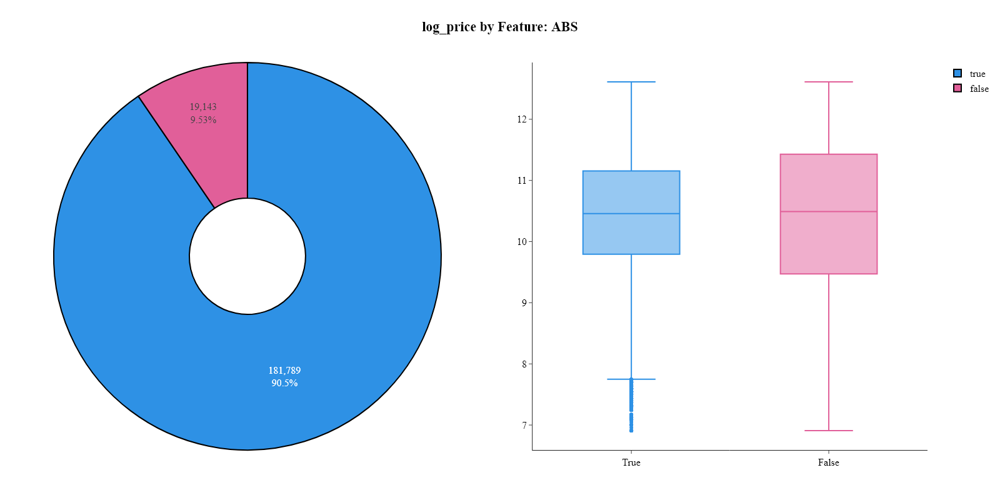

,Category,Count,Percentage (%)
0,True,"181,789",90.47%
1,False,"19,143",9.53%


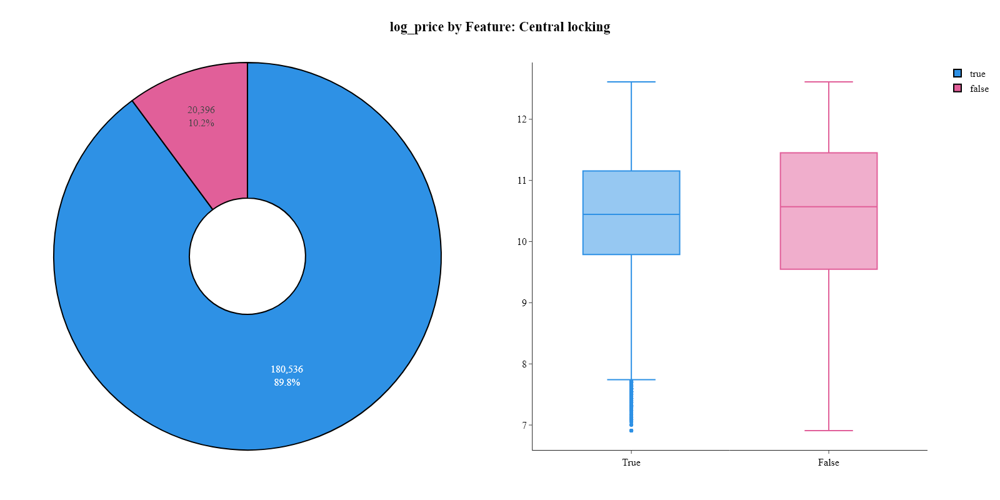

,Category,Count,Percentage (%)
0,True,"180,536",89.85%
1,False,"20,396",10.15%


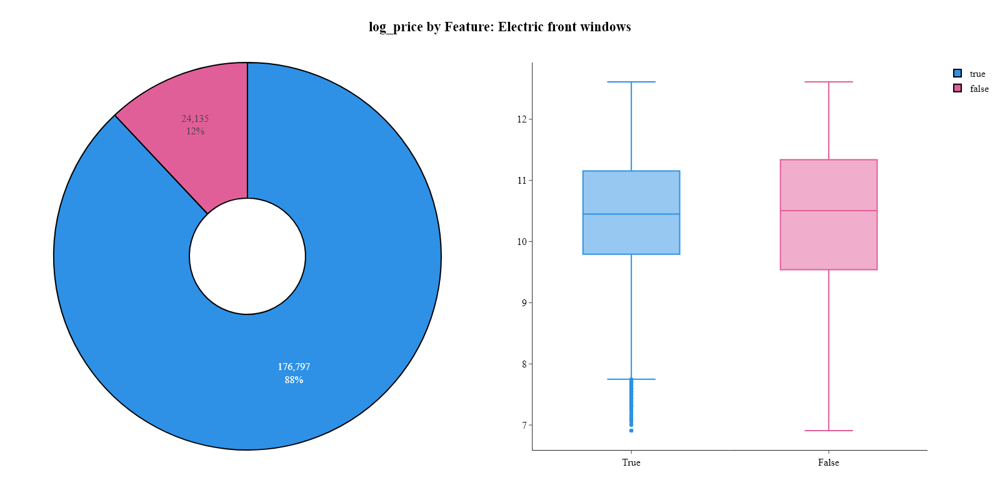

,Category,Count,Percentage (%)
0,True,"176,797",87.99%
1,False,"24,135",12.01%


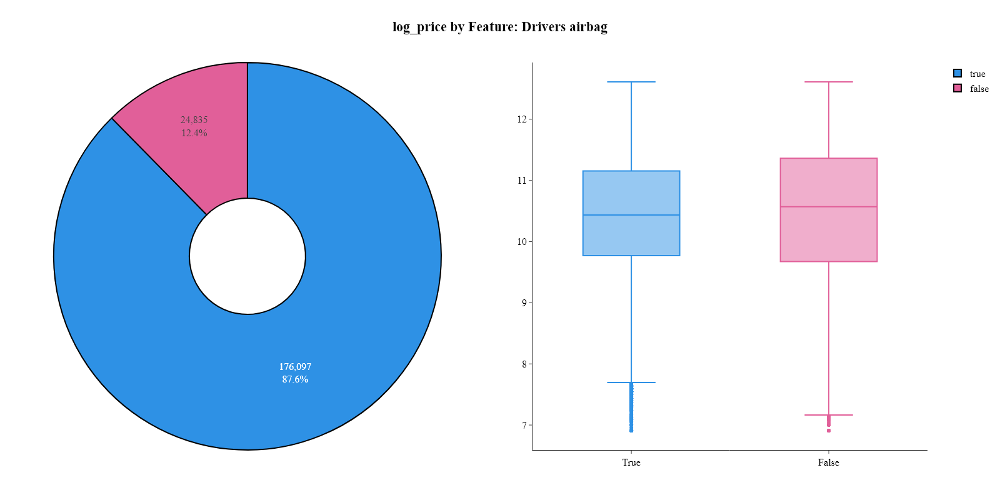

,Category,Count,Percentage (%)
0,True,"176,097",87.64%
1,False,"24,835",12.36%


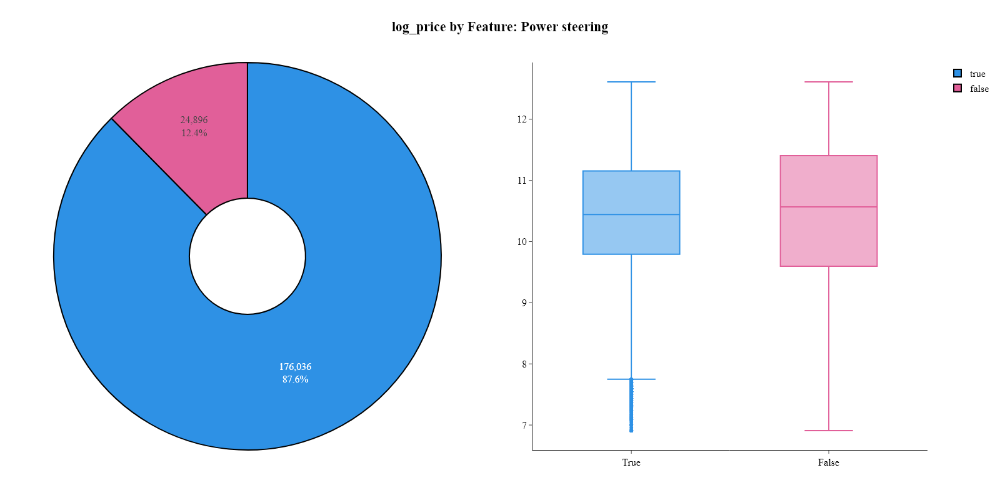

,Category,Count,Percentage (%)
0,True,"176,036",87.61%
1,False,"24,896",12.39%


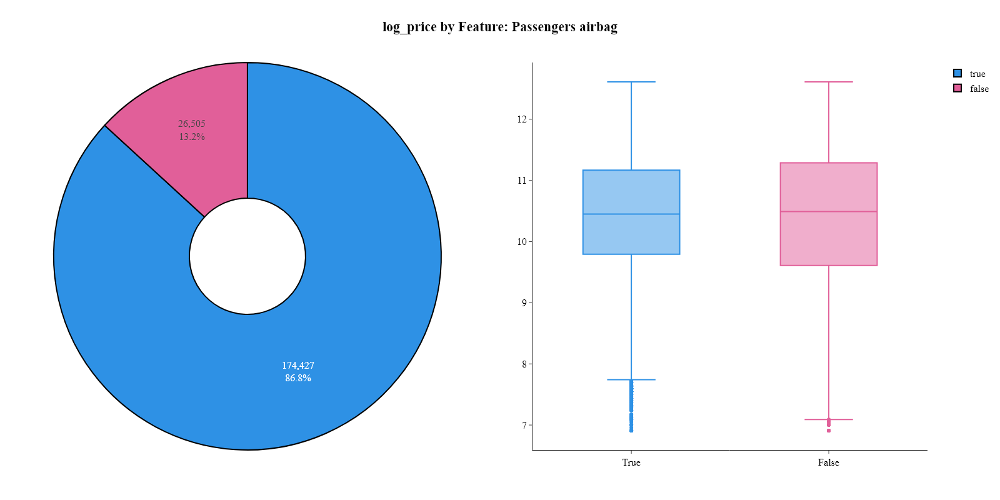

,Category,Count,Percentage (%)
0,True,"174,427",86.81%
1,False,"26,505",13.19%


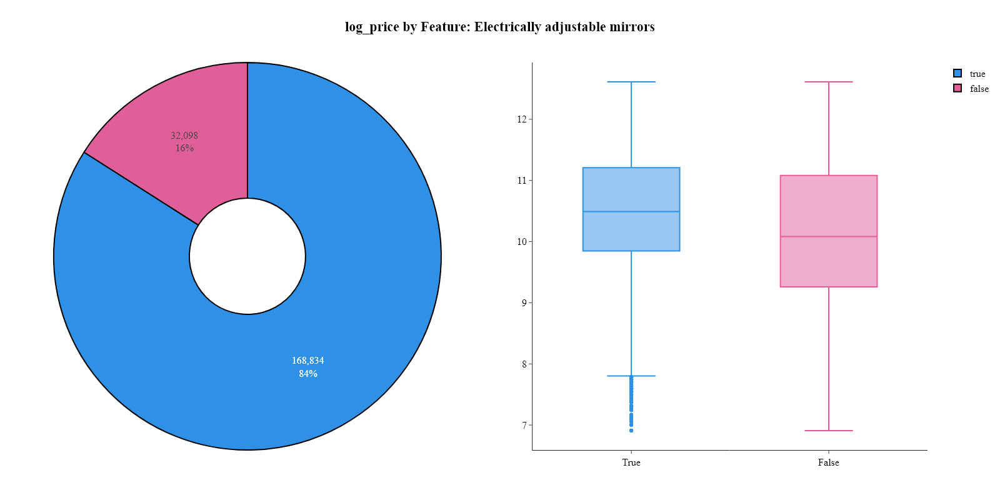

,Category,Count,Percentage (%)
0,True,"168,834",84.03%
1,False,"32,098",15.97%


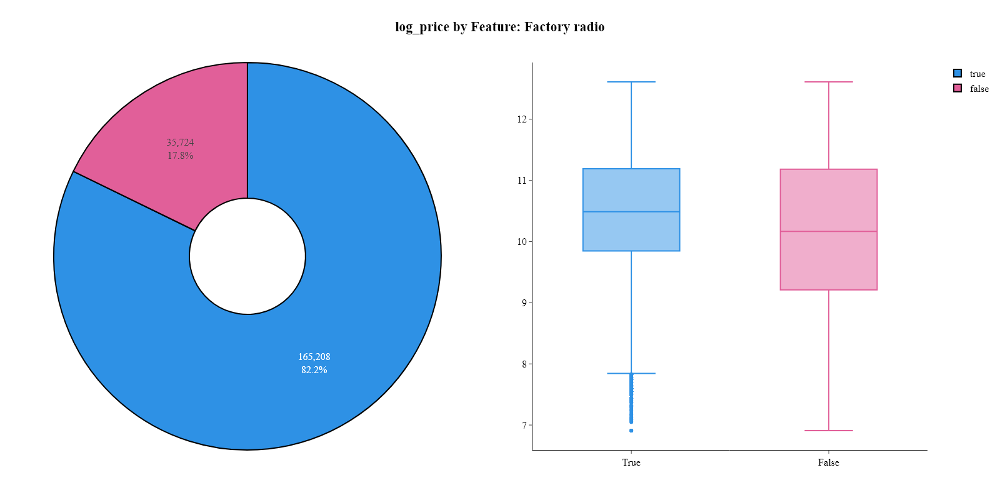

,Category,Count,Percentage (%)
0,True,"165,208",82.22%
1,False,"35,724",17.78%


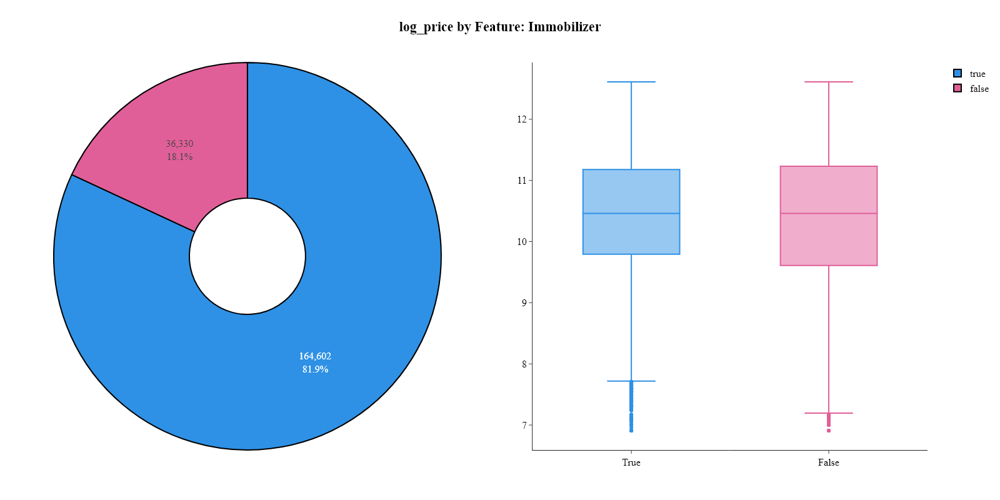

,Category,Count,Percentage (%)
0,True,"164,602",81.92%
1,False,"36,330",18.08%


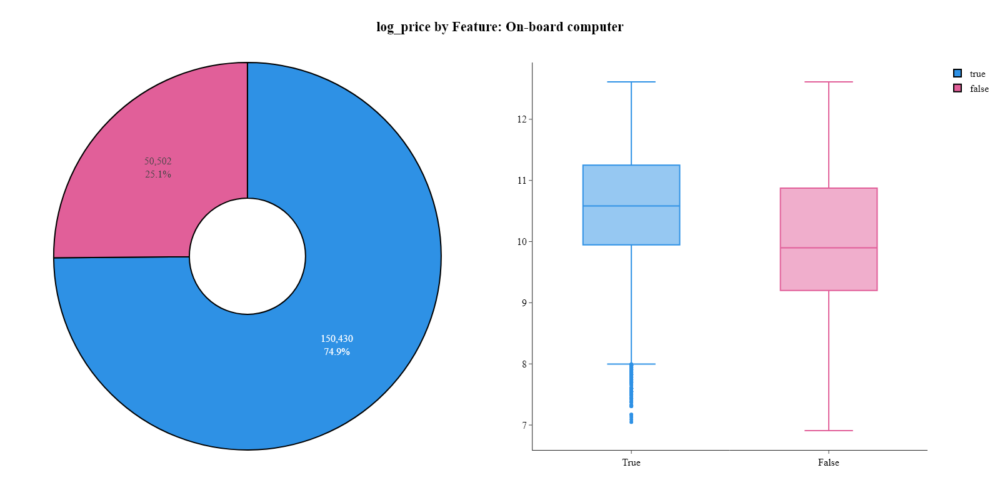

,Category,Count,Percentage (%)
0,True,"150,430",74.87%
1,False,"50,502",25.13%


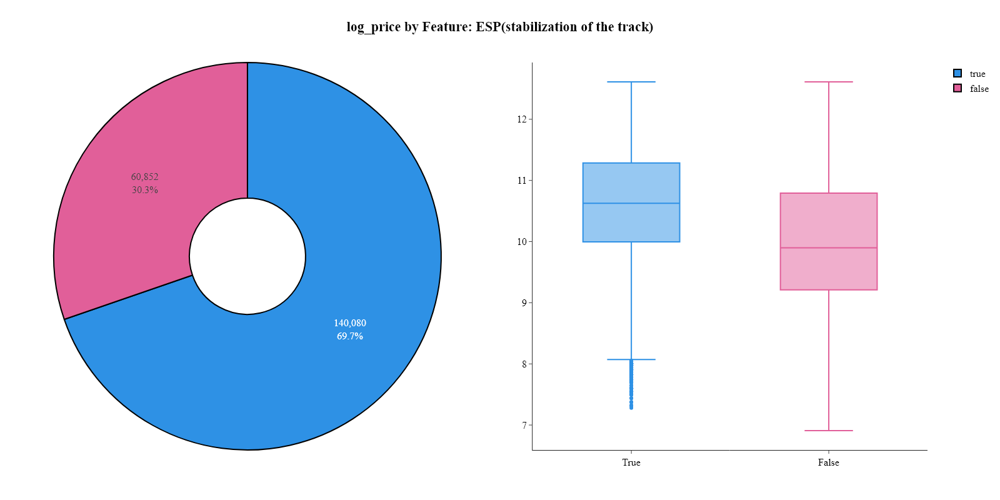

,Category,Count,Percentage (%)
0,True,"140,080",69.72%
1,False,"60,852",30.28%


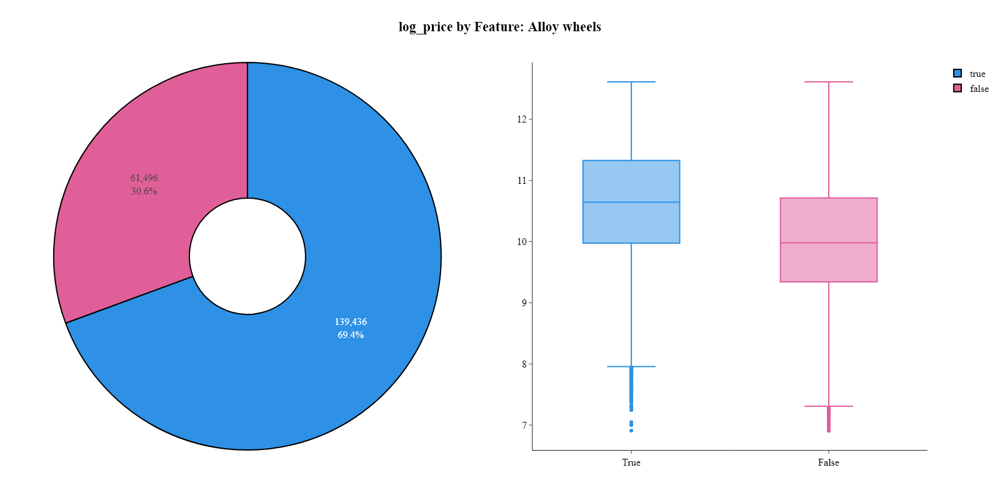

,Category,Count,Percentage (%)
0,True,"139,436",69.39%
1,False,"61,496",30.61%


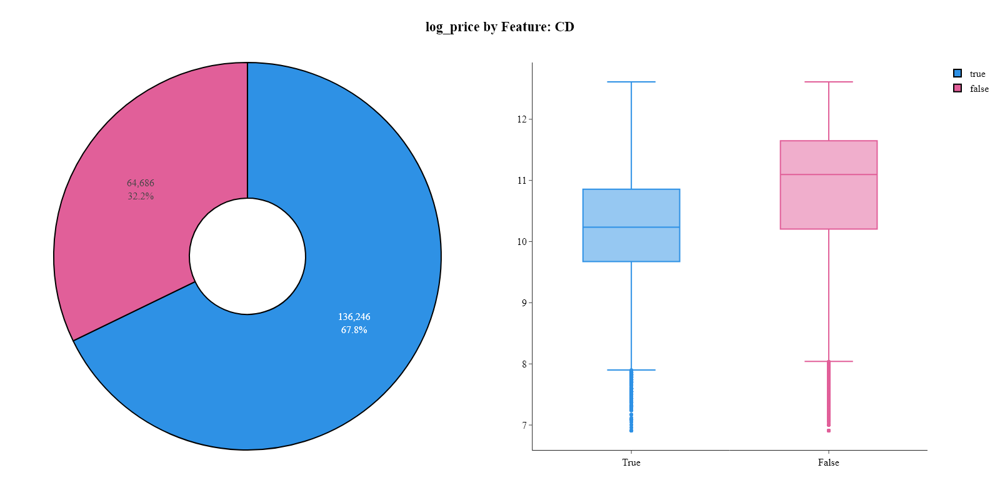

,Category,Count,Percentage (%)
0,True,"136,246",67.81%
1,False,"64,686",32.19%


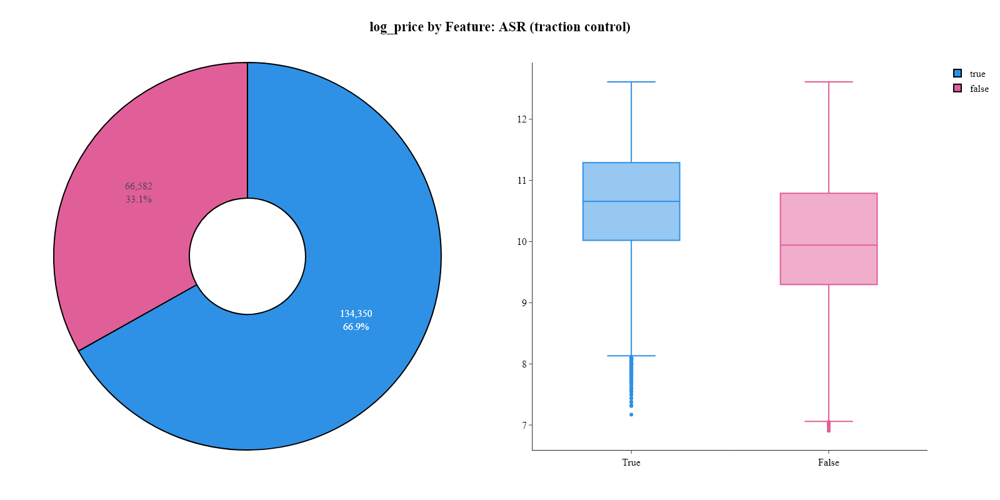

,Category,Count,Percentage (%)
0,True,"134,350",66.86%
1,False,"66,582",33.14%


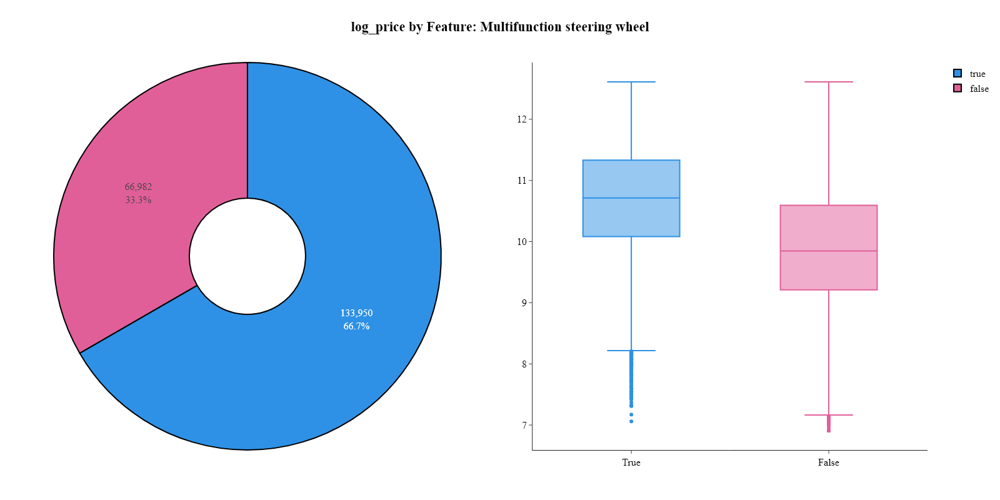

,Category,Count,Percentage (%)
0,True,"133,950",66.66%
1,False,"66,982",33.34%


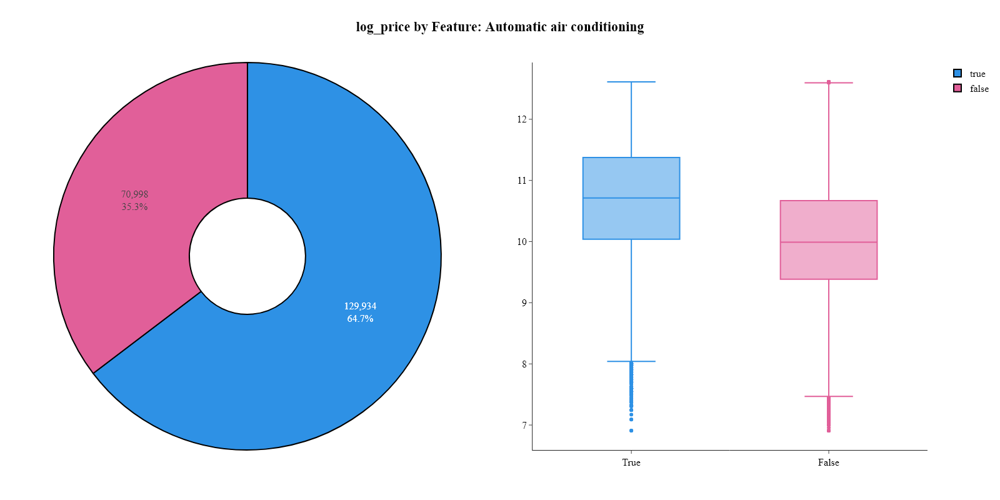

,Category,Count,Percentage (%)
0,True,"129,934",64.67%
1,False,"70,998",35.33%


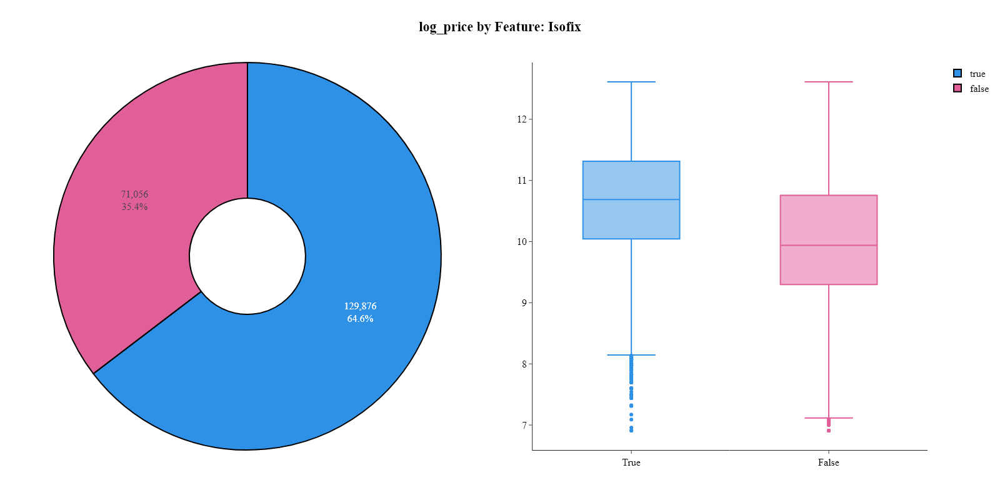

,Category,Count,Percentage (%)
0,True,"129,876",64.64%
1,False,"71,056",35.36%


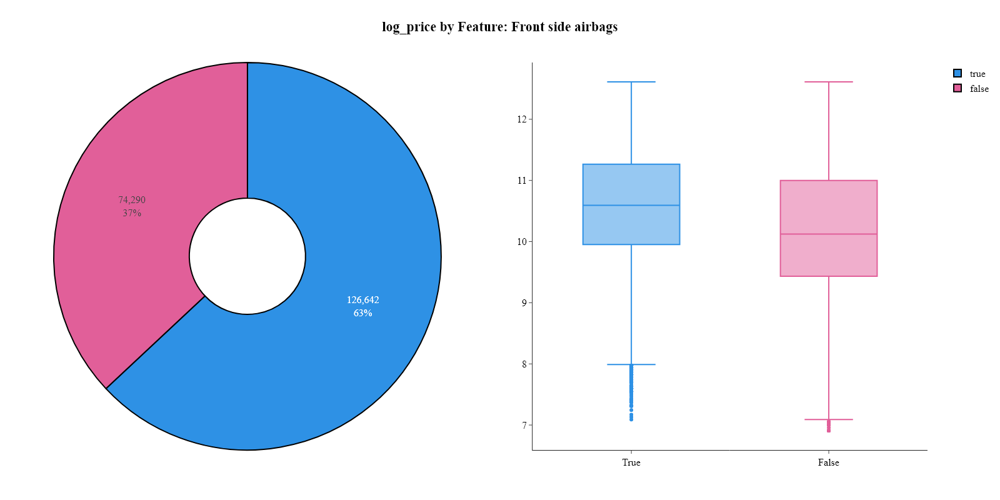

,Category,Count,Percentage (%)
0,True,"126,642",63.03%
1,False,"74,290",36.97%


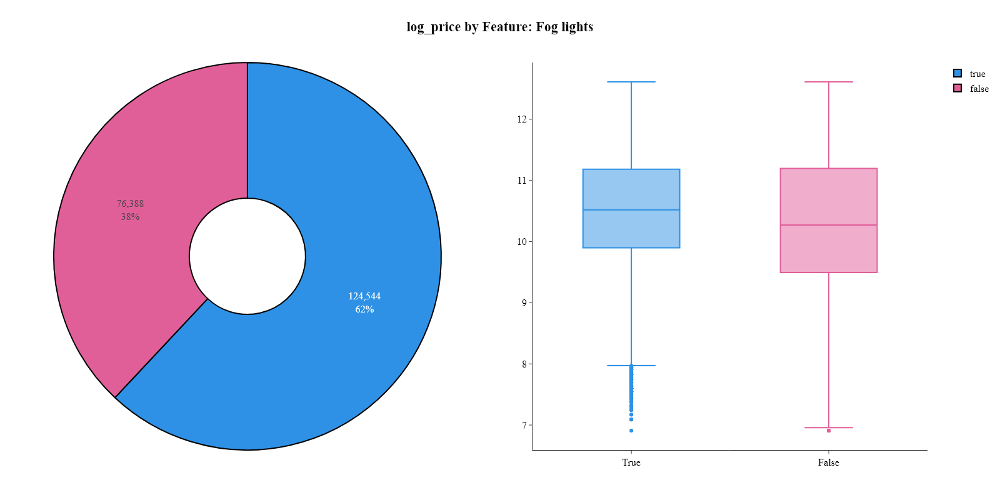

,Category,Count,Percentage (%)
0,True,"124,544",61.98%
1,False,"76,388",38.02%


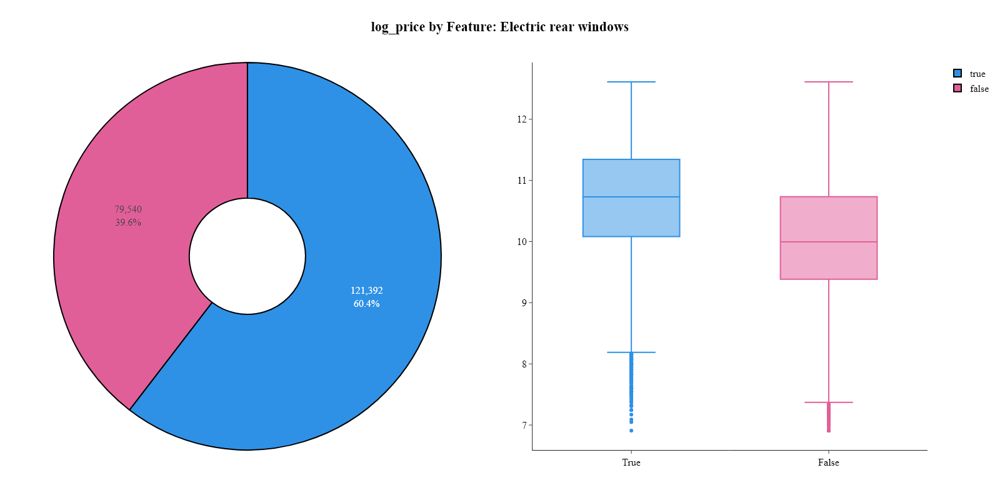

,Category,Count,Percentage (%)
0,True,"121,392",60.41%
1,False,"79,540",39.59%


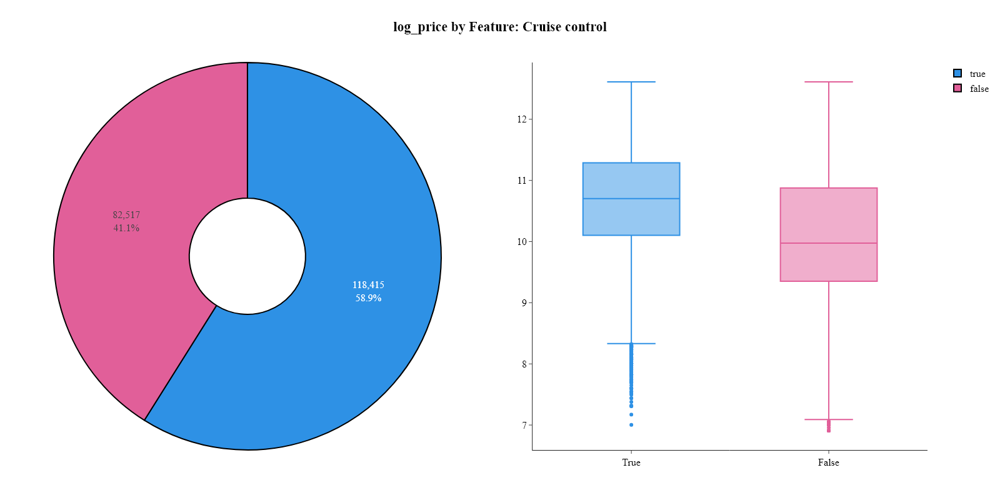

,Category,Count,Percentage (%)
0,True,"118,415",58.93%
1,False,"82,517",41.07%


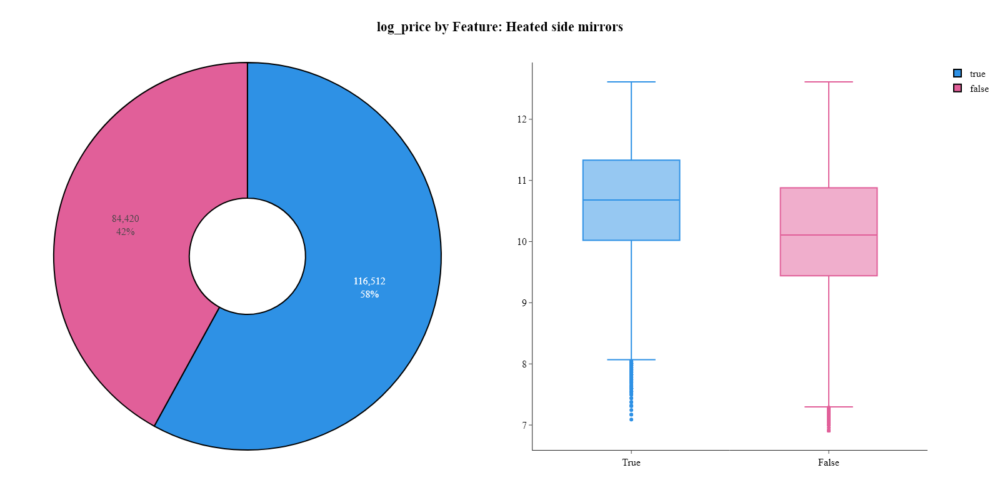

,Category,Count,Percentage (%)
0,True,"116,512",57.99%
1,False,"84,420",42.01%


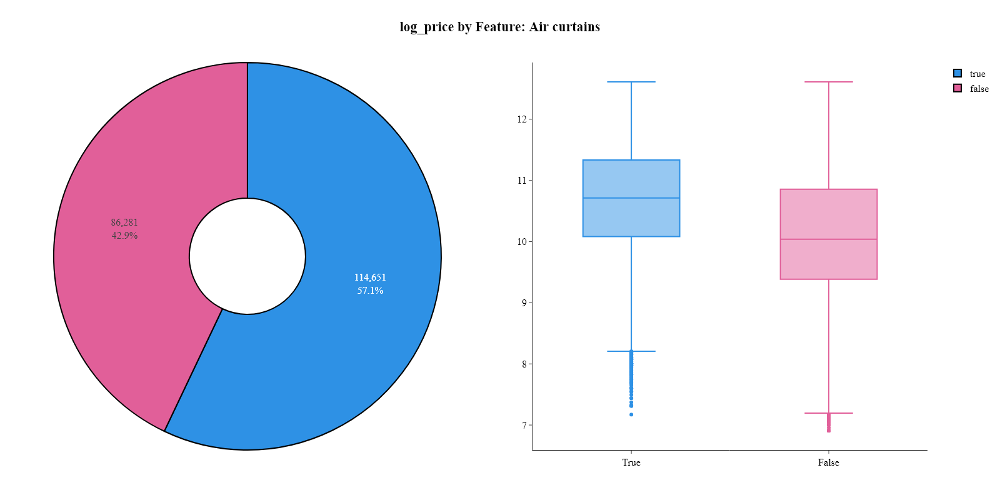

,Category,Count,Percentage (%)
0,True,"114,651",57.06%
1,False,"86,281",42.94%


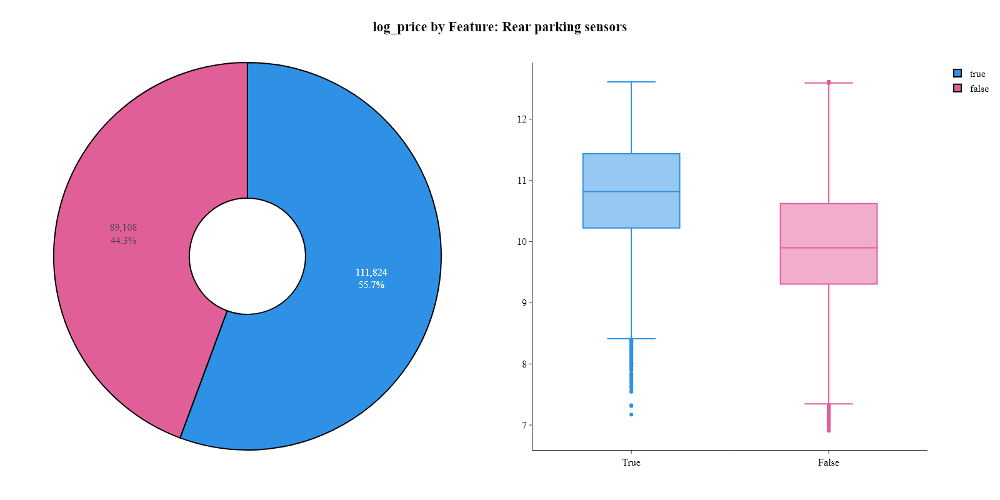

,Category,Count,Percentage (%)
0,True,"111,824",55.65%
1,False,"89,108",44.35%


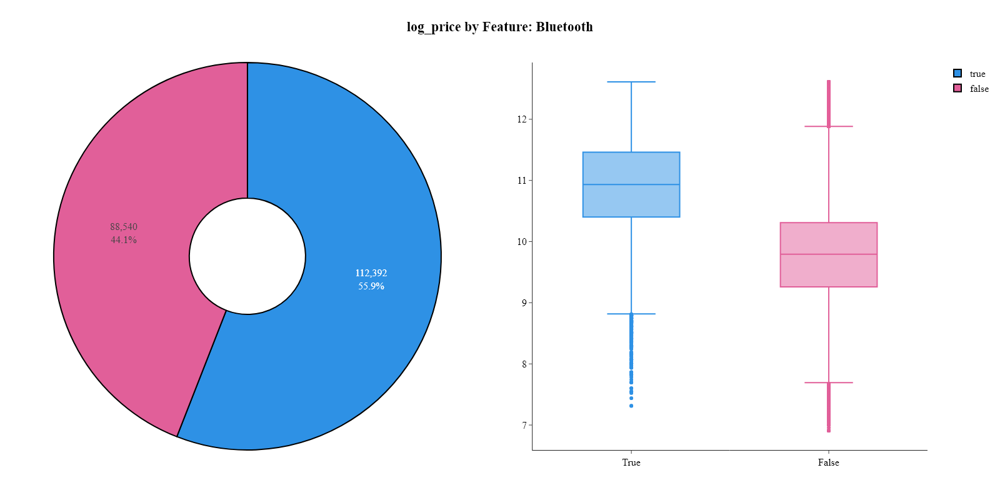

,Category,Count,Percentage (%)
0,True,"112,392",55.94%
1,False,"88,540",44.06%


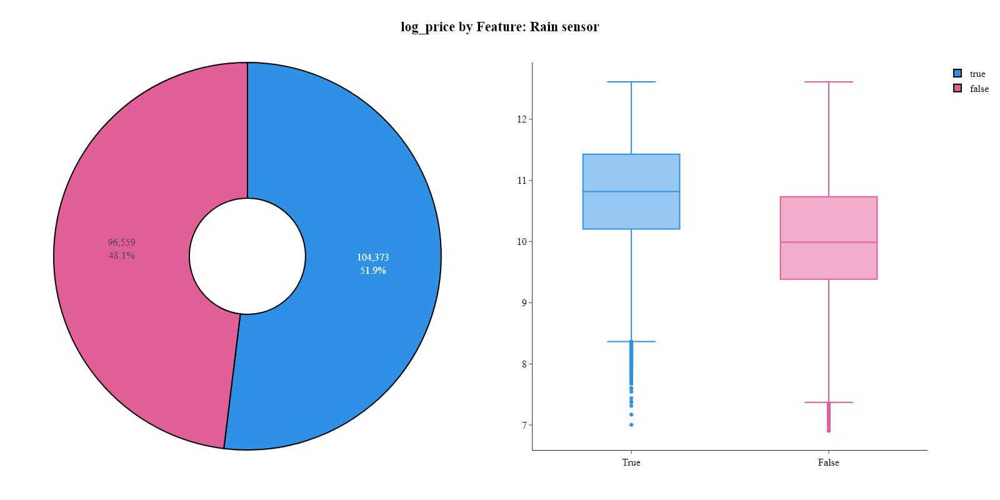

,Category,Count,Percentage (%)
0,True,"104,373",51.94%
1,False,"96,559",48.06%


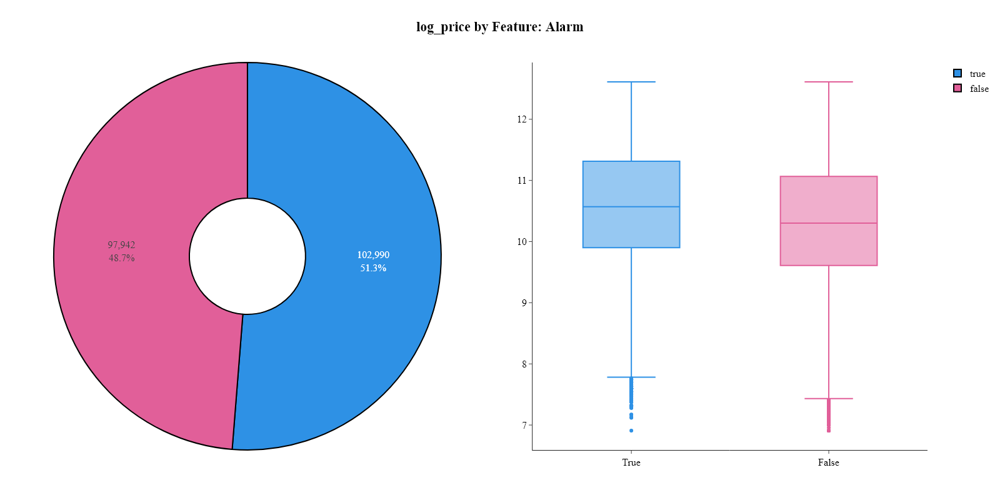

,Category,Count,Percentage (%)
0,True,"102,990",51.26%
1,False,"97,942",48.74%


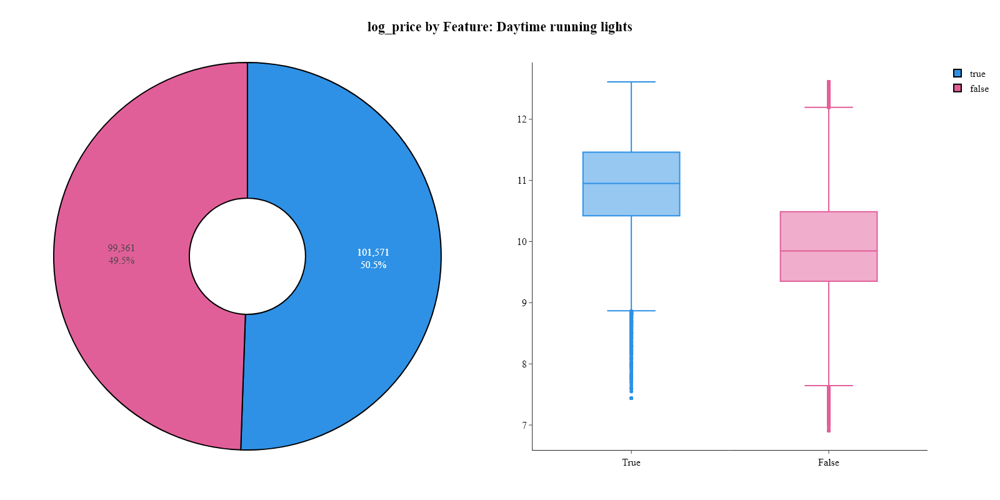

,Category,Count,Percentage (%)
0,True,"101,571",50.55%
1,False,"99,361",49.45%


In [49]:
top_features =  feature_counts[feature_counts >= 0.5 * len(data)].index.tolist()
for feature in top_features:
    data[f"feature_{feature}"] = data["Features"].apply(lambda x: True if feature in ast.literal_eval(x) else False if pd.notna(x) else False)
    data[f"feature_{feature}"] = data[f"feature_{feature}"].astype('category')
    plots.pie_boxplot_by_categorical(data, f"feature_{feature}", target_feature, plot_title=f"{target_feature} by Feature: {feature}")
    display(describe_categorical_feature(data, f"feature_{feature}"))
data.drop(columns=["Features"], inplace=True)

# Feature extraction

This section will be used to extract new features from the existing ones. The new features will be used in modeling.

## `age_at_sale`

- Motivation: The EDA showed strong price dependence on both `Production_year` and `First_registration_year`, but these are highly correlated. A direct "age at sale" feature may better capture depreciation and nonlinear effects.
- Description: The number of years between the car's production and the offer publication date. This feature captures the true age of the car at the time of sale, which is a key driver of price and can reveal nonlinear depreciation patterns.

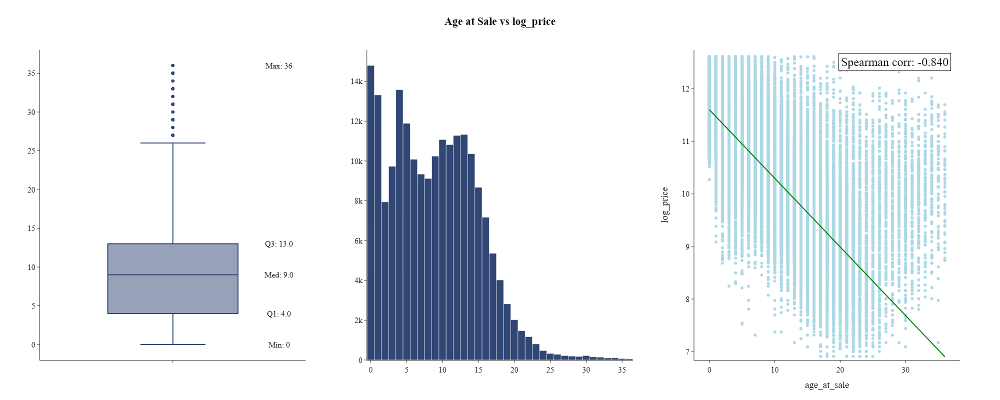

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
age_at_sale,"200,932",8.80,6.08,0.00,0.00,4.00,9.00,13.00,19.00,36.00,36.91,0.52,0.13


In [50]:
data['age_at_sale'] = data['Offer_publication_date'].dt.year - data['Production_year']
plots.histogram_boxplot_linear_regression(data, 'age_at_sale', target_feature, annotations=True, bin_size=1, plot_title=f"Age at Sale vs {target_feature}")
describe_numerical_feature(data, 'age_at_sale')

In [51]:
data.drop(columns=["Offer_publication_date"], inplace=True)

**Notes:**
- Most cars are between 5 and 15 years old at the time of sale.
- Price decreases with increasing age, with a steep drop in the first 10 years.
- Distribution is right-skewed, with a small number of very old cars.


## `power_to_weight_ratio`

- Motivation: Scatterplots and domain knowledge suggest that both `Power_HP` and `Displacement_cm3` are related to price, but their interaction (performance per engine size) may be more predictive.
- Description: The ratio of horsepower to engine displacement (HP per 1000 cm³). This feature captures the efficiency and performance orientation of the vehicle, which can be a strong price signal, especially for sports or luxury cars.

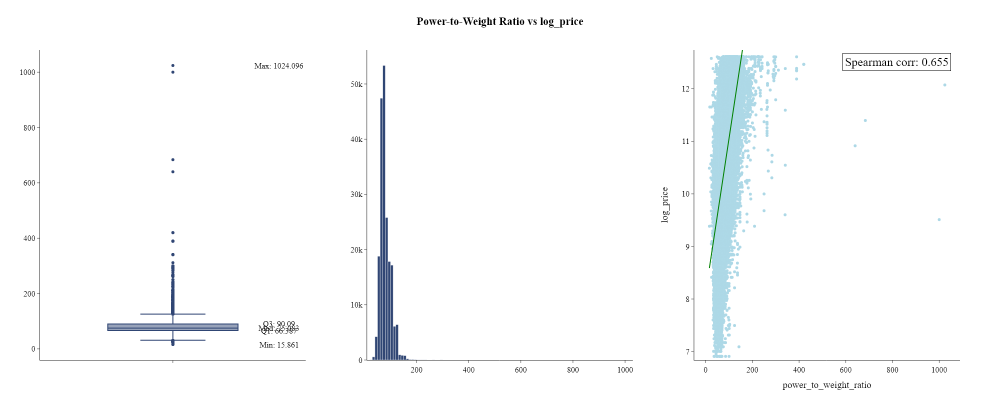

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
power_to_weight_ratio,"200,932",79.40,20.47,15.86,54.17,66.39,75.08,90.09,119.18,"1,024.10",418.97,2.64,56.36


In [52]:
data['power_to_weight_ratio'] = data['Power_HP'] / (data['Displacement_cm3'] / 1000)
plots.histogram_boxplot_linear_regression(data, 'power_to_weight_ratio', target_feature, annotations=True, bin_size=10, plot_title=f"Power-to-Weight Ratio vs {target_feature}")
describe_numerical_feature(data, 'power_to_weight_ratio')

**Notes:**
- Most cars have a power-to-weight ratio between 50 and 150 HP/1000 cm³.
- Higher ratios are associated with higher prices, but the relationship is not strictly linear.
- A small number of cars have very high ratios, likely representing sports or performance vehicles.


## `mileage_per_year`

- Motivation: EDA revealed that both `Mileage_km` and car age are important, but their interaction (usage intensity) may better capture wear and tear or hidden value.
- Description: The average kilometers driven per year (`Mileage_km` divided by `age_at_sale`). This feature helps distinguish between cars that are old but lightly used and those that are newer but heavily used, which can impact price and reliability.

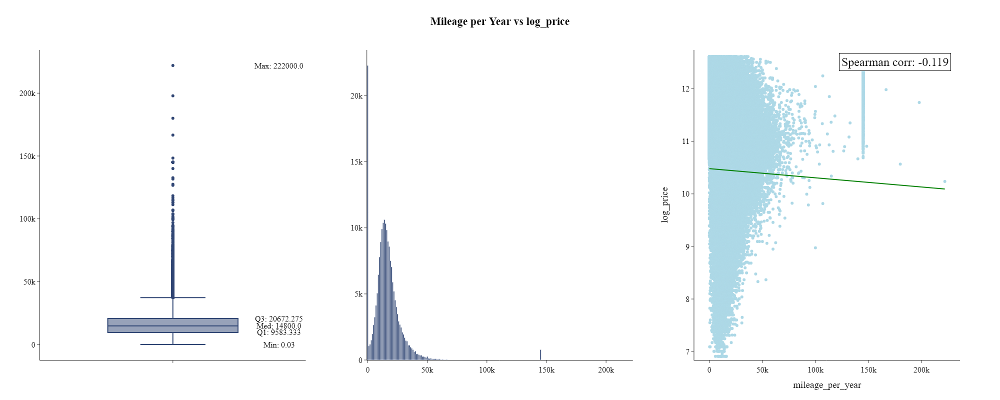

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis
mileage_per_year,"200,932","16,088.80","13,147.04",0.03,5.00,"9,583.33","14,800.00","20,672.28","34,864.77","222,000.00","172,844,775.34",4.17,36.17


In [53]:
data['mileage_per_year'] = data['Mileage_km'] / data['age_at_sale'].replace(0, 1)  # Avoid division by zero
plots.histogram_boxplot_linear_regression(data, 'mileage_per_year', target_feature, annotations=True, bin_size=1000, plot_title=f"Mileage per Year vs {target_feature}")
describe_numerical_feature(data, 'mileage_per_year')

**Notes:**
- The majority of cars have an average mileage per year between 10,000 and 20,000 km.
- Distribution is right-skewed, with some cars showing very high annual mileage.
- Negative correlation observed between mileage per year and price; higher usage intensity generally corresponds to lower prices.


## `is_luxury_brand`

- Motivation: Boxplots by brand show clear price stratification, with certain brands consistently commanding higher prices.
- Description: A binary flag indicating whether the car's brand is considered "luxury" (e.g., BMW, Mercedes-Benz, Audi, Lexus, Jaguar, Porsche). This can help models capture nonlinear brand effects and segment the market.

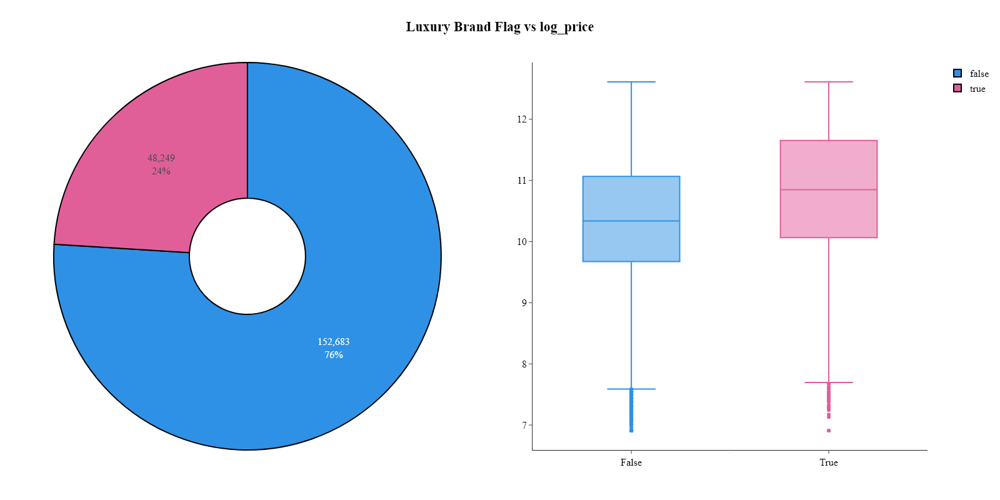

,Category,Count,Percentage (%)
0,False,"152,683",75.99%
1,True,"48,249",24.01%


In [54]:
luxury_brands = ['BMW', 'Mercedes-Benz', 'Audi', 'Lexus', 'Jaguar', 'Porsche', 'Land Rover', 'Infiniti', 'Volvo']
data['is_luxury_brand'] = data['Vehicle_brand'].isin(luxury_brands).astype("category")
plots.pie_boxplot_by_categorical(data, 'is_luxury_brand', target_feature, plot_title=f"Luxury Brand Flag vs {target_feature}")
describe_categorical_feature(data, 'is_luxury_brand')

**Notes:**
- Only a small fraction of cars are classified as luxury brands.
- Median price for luxury brands is substantially higher than for non-luxury brands.
- Price range for luxury brands is wider, with more high-value outliers.


## `high_mileage_flag`

- Motivation: EDA and domain knowledge suggest that cars with very high mileage are valued differently, regardless of age or other features.
- Description: A binary flag indicating whether the car's mileage is above the 90th percentile for its age group. This can help capture outlier usage patterns and potential reliability concerns.

C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\1656574471.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



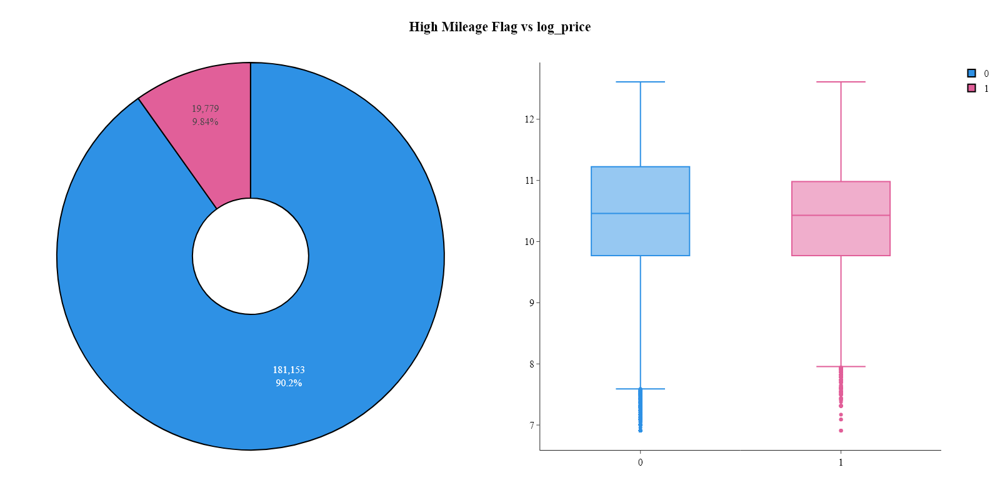

,Category,Count,Percentage (%)
0,0,"181,153",90.16%
1,1,"19,779",9.84%


In [55]:
age_bins = pd.qcut(data['age_at_sale'], q=5, duplicates='drop')
high_mileage_thresholds = data.groupby(age_bins)['Mileage_km'].quantile(0.9)
def is_high_mileage(row):
    try:
        threshold = high_mileage_thresholds.loc[age_bins[row.name]]
        return int(row['Mileage_km'] > threshold)
    except:
        return 0
data['high_mileage_flag'] = data.apply(is_high_mileage, axis=1)
data['high_mileage_flag'] = data['high_mileage_flag'].astype('category')
plots.pie_boxplot_by_categorical(data, 'high_mileage_flag', target_feature, plot_title=f"High Mileage Flag vs {target_feature}")
describe_categorical_feature(data, 'high_mileage_flag')

**Notes:**
- Only a small proportion of cars are flagged as high mileage (above the 90th percentile for their age group).
- Median price for high mileage cars is lower than for others.
- High mileage cars show a wider spread in prices, with more low-value outliers.


## `feature_count_bucket`

- Motivation: The number of features (`Features_count`) is important, but its effect may be nonlinear. Bucketing can help capture diminishing returns or segment the market.
- Description: Buckets the number of features into quartiles, creating a categorical variable that can be used for interaction or as a standalone feature.

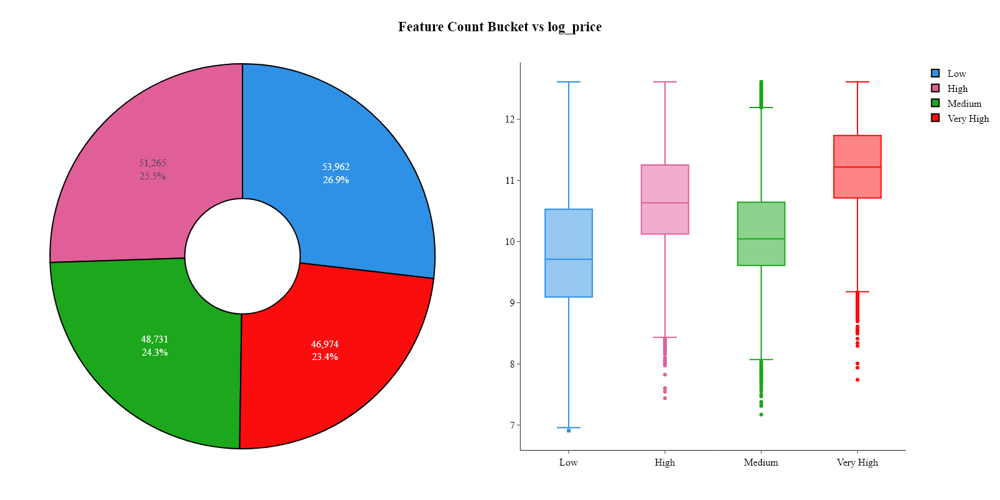

,Category,Count,Percentage (%)
0,Low,"53,962",26.86%
1,High,"51,265",25.51%
2,Medium,"48,731",24.25%
3,Very High,"46,974",23.38%


In [56]:
data['feature_count_bucket'] = pd.qcut(data['Features_count'], q=4, labels=['Low', 'Medium', 'High', 'Very High'])
plots.pie_boxplot_by_categorical(data, 'feature_count_bucket', target_feature, plot_title=f"Feature Count Bucket vs {target_feature}")
describe_categorical_feature(data, 'feature_count_bucket')

**Notes:**
- Cars in the 'Very High' feature count bucket have the highest median prices.
- The majority of cars fall into the 'Medium' and 'High' buckets.
- Price increases with feature count, but the effect is less pronounced at the highest bucket.


## `is_weekend_offer`

- Motivation: EDA on offer publication weekday suggests possible behavioral or demand differences for cars listed on weekends.
- Description: A binary flag indicating whether the offer was published on a Saturday or Sunday. This may capture demand surges or seller strategies.

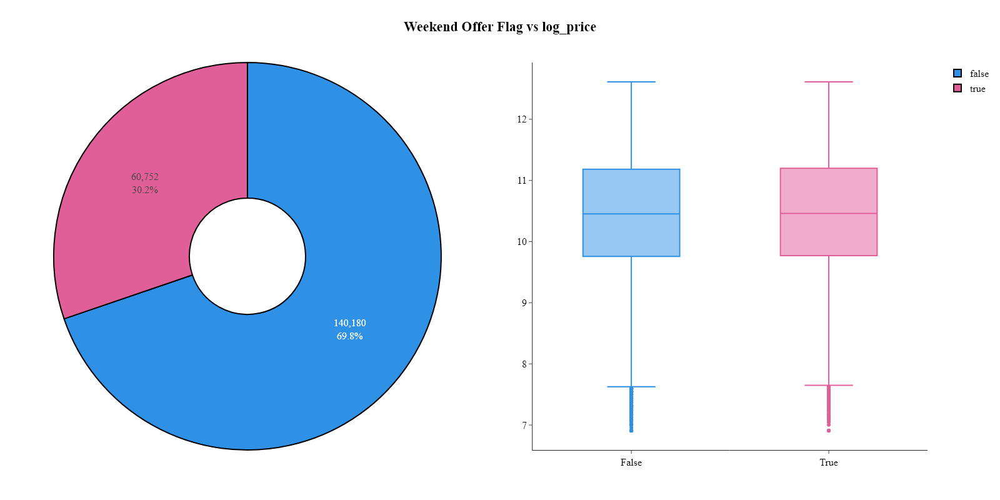

,Category,Count,Percentage (%)
0,False,"140,180",69.76%
1,True,"60,752",30.24%


In [57]:
data['is_weekend_offer'] = data['Offer_publication_weekday'].isin(['Saturday', 'Sunday']).astype("category")
plots.pie_boxplot_by_categorical(data, 'is_weekend_offer', target_feature, plot_title=f"Weekend Offer Flag vs {target_feature}")
describe_categorical_feature(data, 'is_weekend_offer')

**Notes:**
- A minority of offers are published on weekends (Saturday or Sunday).
- Median price for weekend offers is similar to weekday offers, with no strong difference.
- The number of weekend offers is lower than for any single weekday.


## `brand_region_interaction`

- Motivation: Regional price differences and brand popularity may interact, as some brands are valued more in certain regions.
- Description: A composite categorical feature combining `Vehicle_brand` and `wojewodztwo` (region), capturing local brand preferences and price effects.

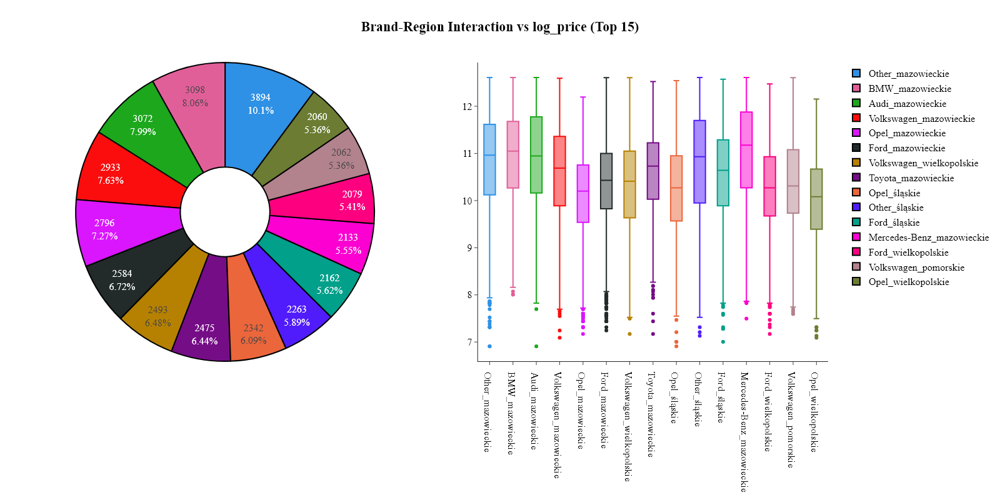

,Category,Count,Percentage (%)
0,Other_mazowieckie,"3,894",1.94%
1,BMW_mazowieckie,"3,098",1.54%
2,Audi_mazowieckie,"3,072",1.53%
3,Volkswagen_mazowieckie,"2,933",1.46%
4,Opel_mazowieckie,"2,796",1.39%
5,Ford_mazowieckie,"2,584",1.29%
6,Volkswagen_wielkopolskie,"2,493",1.24%
7,Toyota_mazowieckie,"2,475",1.23%
8,Opel_śląskie,"2,342",1.17%
9,Other_śląskie,"2,263",1.13%


In [58]:
data['brand_region_interaction'] = data['Vehicle_brand'].astype(str) + '_' + data['wojewodztwo'].astype(str)
data['brand_region_interaction'] = data['brand_region_interaction'].astype('category')
plots.pie_boxplot_by_categorical_top_n(data, 'brand_region_interaction', target_feature, n=15, plot_title=f"Brand-Region Interaction vs {target_feature} (Top 15)")
describe_categorical_feature(data, 'brand_region_interaction', top_n=15)

**Notes:**
- The most frequent brand-region combinations are dominated by popular brands in large regions.
- Median price varies widely across combinations, with some regions showing higher prices for specific brands.
- A few combinations account for a large share of listings, while most are rare.


## `is_old_low_km`

- Motivation: Domain logic and EDA suggest that old cars with unusually low mileage may be special cases (e.g., collector's items, rarely used, or odometer rollback risk).
- Description: A binary flag for cars older than 15 years with mileage below the 25th percentile for their age group.

C:\Users\Kuba\AppData\Local\Temp\ipykernel_7840\1095747192.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



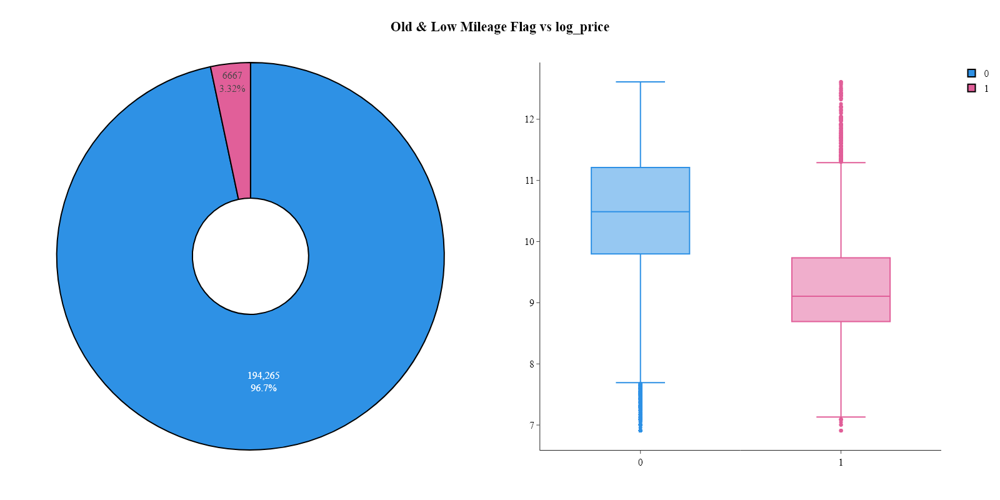

,Category,Count,Percentage (%)
0,0,"194,265",96.68%
1,1,"6,667",3.32%


In [59]:
old_threshold = 15
low_km_thresholds = data.groupby(age_bins)['Mileage_km'].quantile(0.25)
def is_old_low_km(row):
    try:
        threshold = low_km_thresholds.loc[age_bins[row.name]]
        return int((row['age_at_sale'] > old_threshold) and (row['Mileage_km'] < threshold))
    except:
        return 0
data['is_old_low_km'] = data.apply(is_old_low_km, axis=1)
data['is_old_low_km'] = data['is_old_low_km'].astype('category')
plots.pie_boxplot_by_categorical(data, 'is_old_low_km', target_feature, plot_title=f"Old & Low Mileage Flag vs {target_feature}")
describe_categorical_feature(data, 'is_old_low_km')

**Notes:**
- Only a small fraction of cars are flagged as old with low mileage.
- Median price for these cars is higher than for other old cars, but the group is small.
- Price range for this group is wide, with some high-value outliers.


# Summary

In [60]:
base_information(data)

,Column,dtypes,Number of missing values,Percentage of missing values,Unique values,Count
0,Condition,category,0,0.00%,2,"200,932"
1,Vehicle_brand,category,0,0.00%,21,"200,932"
2,Vehicle_model,category,0,0.00%,"1,050","200,932"
3,Production_year,int64,0,0.00%,37,"200,932"
4,Mileage_km,float64,0,0.00%,"51,054","200,932"
5,Power_HP,float64,0,0.00%,481,"200,932"
6,Displacement_cm3,float64,0,0.00%,965,"200,932"
7,Fuel_type,category,0,0.00%,5,"200,932"
8,Drive,category,0,0.00%,5,"200,932"
9,Transmission,category,0,0.00%,2,"200,932"


# Save the transformed dataset

In [61]:
data.to_csv("../data/data_feature_engineered.csv", index=False)
categorical_features = data.select_dtypes(include=['category']).columns.tolist()
print(categorical_features)

['Condition', 'Vehicle_brand', 'Vehicle_model', 'Fuel_type', 'Drive', 'Transmission', 'Type', 'Colour', 'Origin_country', 'First_registration_year', 'First_registration_month', 'Offer_publication_day', 'Offer_publication_weekday', 'wojewodztwo', 'feature_ABS', 'feature_Central locking', 'feature_Electric front windows', 'feature_Drivers airbag', 'feature_Power steering', 'feature_Passengers airbag', 'feature_Electrically adjustable mirrors', 'feature_Factory radio', 'feature_Immobilizer', 'feature_On-board computer', 'feature_ESP(stabilization of the track)', 'feature_Alloy wheels', 'feature_CD', 'feature_ASR (traction control)', 'feature_Multifunction steering wheel', 'feature_Automatic air conditioning', 'feature_Isofix', 'feature_Front side airbags', 'feature_Fog lights', 'feature_Electric rear windows', 'feature_Cruise control', 'feature_Heated side mirrors', 'feature_Air curtains', 'feature_Rear parking sensors', 'feature_Bluetooth', 'feature_Rain sensor', 'feature_Alarm', 'featur